# Reinforced learning, työllistyminen ja Suomen sosiaaliturva

Tässä tehdään laskelmat artikkelia varten. Käytössä on gym-ympäristö _unemployment-v1_ , johon on toteutettu yksityiskohtaisempi työttömyysturvamalli.

In [1]:
# for Colab, install fin_benefits and unemployment-gym from Github
#!pip install -q git+https://github.com/ajtanskanen/benefits.git  
#!pip install -q git+https://github.com/ajtanskanen/econogym.git
#!pip install -q git+https://github.com/ajtanskanen/lifecycle-rl.git

# and then restart kernel
  
  # For a specific version:
#!pip install tensorflow==1.15
#!pip install stable-baselines==2.8
  
# restart kernel after running pip's

Then load all modules and set parameters for simulations.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from lifecycle_rl import Lifecycle

%matplotlib inline
%pylab inline

# varoitukset piiloon (Stable baseline ei ole vielä Tensorflow 2.0-yhteensopiva, ja Tensorflow 1.15 valittaa paljon)
# ei taida toimia piilottaminen
import warnings
warnings.filterwarnings('ignore')


The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Populating the interactive namespace from numpy and matplotlib


In [4]:
# parameters for the simulation
# episode = 51 / 205 timesteps (1y/3m timestep)
pop_size=20_000 # size of the population to be simulated
size1=10_000_000 # number of timesteps in phase 1 training (callback not used)
size2=100_000_000 # number of timesteps in phase 2 training (callback is used to save the best results)
size3=20_000_000 # number of timesteps in phase 1 training (callback not used) for policy changes
batch1=1_00 # size of minibatch in phase 1 as number of episodes
batch2=9_00  # size of minibatch in phase 1 as number of episodes
callback_minsteps=batch2 # how many episodes callback needs 
deterministic=False # use deterministic prediction (True) or probabilitic prediction (False)
mortality=False # include mortality in computations
randomness=True # include externally given, random state-transitions (parental leaves, disability, lay-offs) 
pinkslip=True # include lay-offs at 5 percent level each year
rlmodel='acktr' # use ACKTR algorithm
twostage=False # ajataan kahdessa vaiheessa vai ei
perusmalli='best/malli_baseline_dev'
perusresults='results/malli_base_dev'

perustulomalli='best/perustulomalli'
perustuloresults='results/perustulo_results9'
perustulomalli_kela='best/perustulomalli_kela'
perustuloresults_kela='results/perustulo_kela'
perustulomalli_vihreat='best/perustulomalli_vihreat'
perustuloresults_vihreat='results/perustulo_vihreat'
perustulomalli_vasemmistoliitto='best/perustulomalli_vasemmistoliitto'
perustuloresults_vasemmistoliitto='results/perustulo_vasemmistoliitto'
perustulomalli_tonni='best/perustulomalli_tonni'
perustuloresults_tonni='results/perustulo_tonni'
perustulomalli_puolitoista='best/perustulomalli_puolitoista'
perustuloresults_puolitoista='results/perustulo_puolitoista'
perustulokokeilu_malli='best/perustulokokeilu_malli'
perustulokokeilu_results='results/perustulokokeilu_results'

# Nykymalli 

Lasketaan työllisyysasteet nykymallissa.

plotdebug False
No mortality included
False
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo False
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+-----------------------+----------------------+----------------------+
|                  |                   e/v |              toteuma |                  ero |
|------------------+-----------------------+----------------------+----------------------|
| palkkatulo       |  89,421,388,349.21    | 89,134,200,000.00    |    287,188,349.21    |
| etuusmeno        |  41,580,523,561.46    | 36,945,147,749.00    |  4,635,375,812.46    |
| verot+maksut     |  31,294,604,923.77    | 30,763,000,000.00    |    531,604,923.77    |
| muut tulot       |  10,285,918,

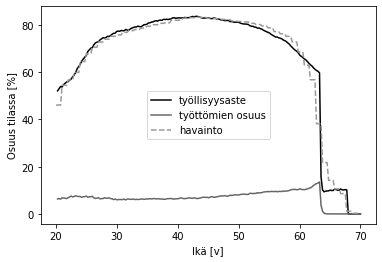

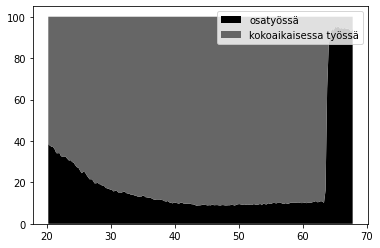

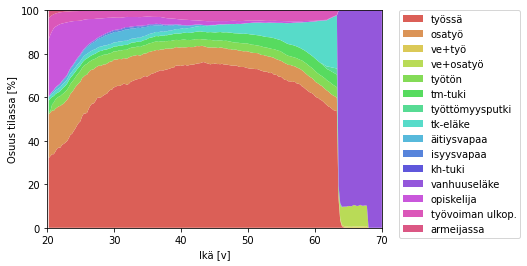

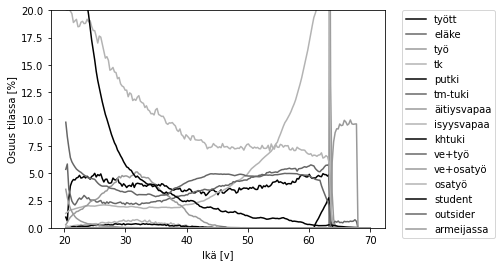

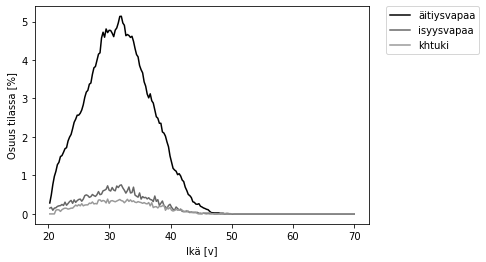

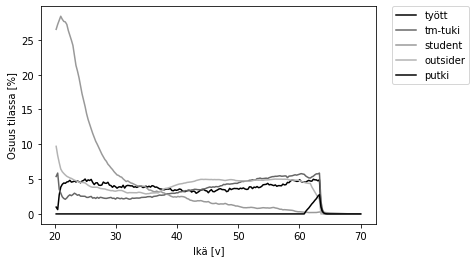

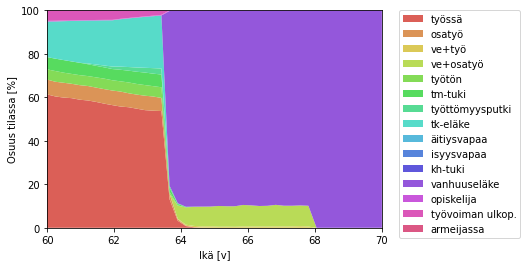

Lisäpäivillä on 3140 henkilöä


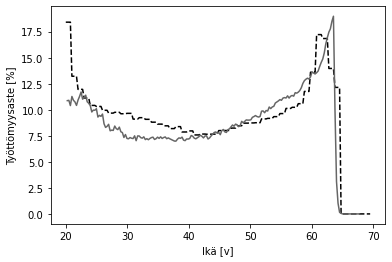

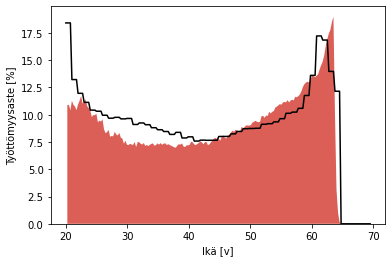

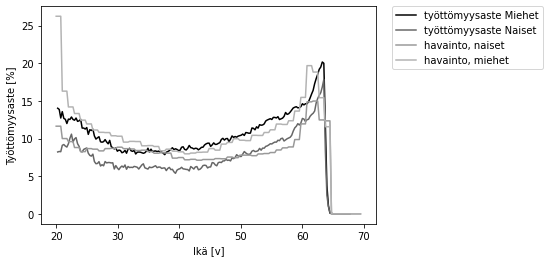

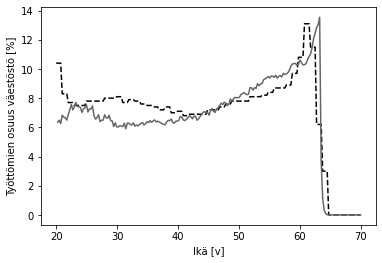

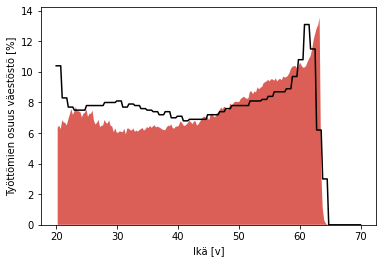

...

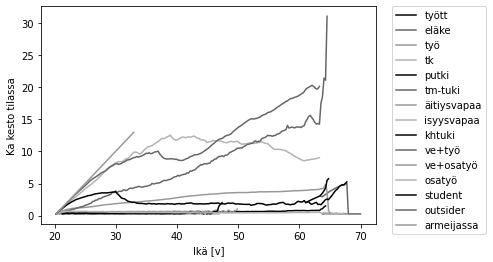

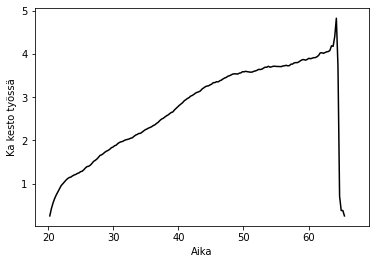

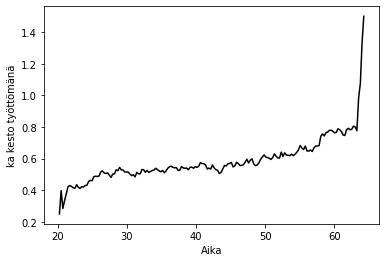

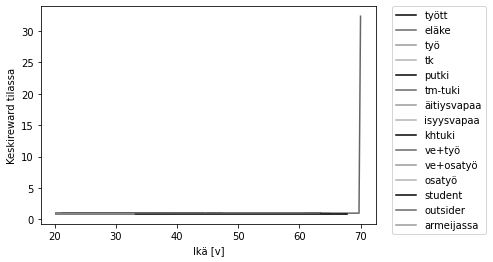

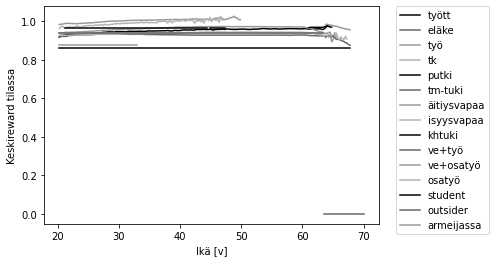

No handles with labels found to put in legend.


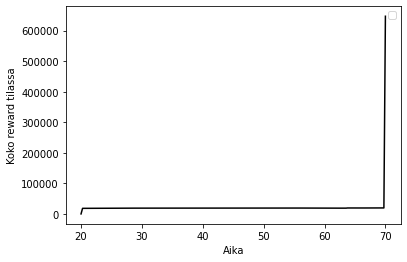

yhteensä reward 223.33125147886545


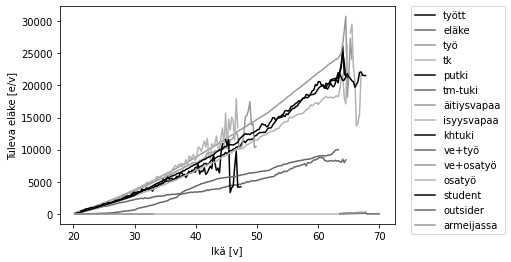

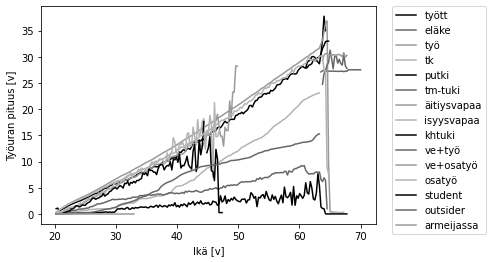

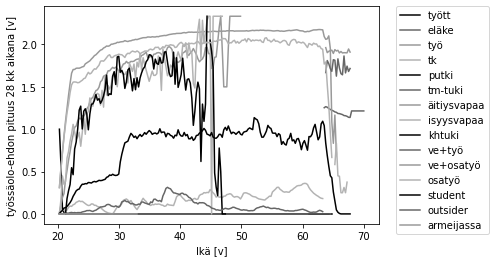

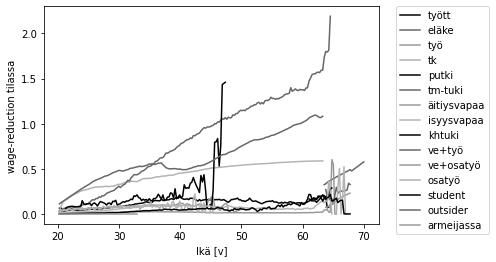

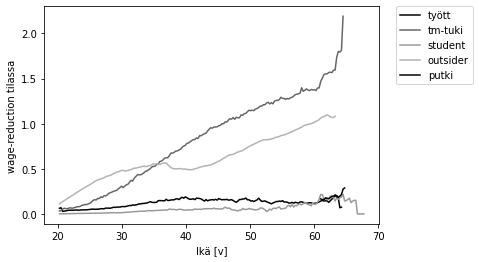

In [7]:
if False: # no baseline here
    cc1=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=False,
                  randomness=randomness,pinkslip=pinkslip,plotdebug=False)
    cc1.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                    train=True,predict=True,batch1=batch1,batch2=batch2,plotdebug=True,
                    save=perusmalli,plot=True,cont=True,start_from=perusmalli,results=perusresults,
                    callback_minsteps=callback_minsteps,rlmodel=rlmodel,twostage=twostage)
else:
    cc1=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=False,
                  randomness=randomness,pinkslip=pinkslip,plotdebug=False)
    cc1.load_sim(load=perusresults)
    cc1.render()

In [5]:
#cc1=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=False,
#                  randomness=randomness,pinkslip=pinkslip,plotdebug=False)



plotdebug False
No mortality included
False
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo False
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True



# Perustulokokeilu

Perustulo 560 e/kk, asumistuen suojaosa 600 e/kk, ei muutoksia verotukseen

In [5]:
cc1_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='perustulokokeilu')
cc1_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulokokeilu_malli,plot=False,
                   results=perustulokokeilu_results,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875




Instructions for updating:
Use keras.layers.flatten instead.
Instructions for updating:
Please use `layer.__call__` method instead.








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where






training...








---------------------------------
| explained_variance | 0.997    |
| fps                | 2845     |
| nupdates           | 1        |
| policy_entropy     | 1.03     |
| policy_loss        | 0.0103   |
| total_timesteps    | 21816    |
| value_loss         | 0.0301   |
-

---------------------------------
| explained_variance | 0.971    |
| fps                | 3050     |
| nupdates           | 60       |
| policy_entropy     | 0.989    |
| policy_loss        | 0.27     |
| total_timesteps    | 1308960  |
| value_loss         | 0.457    |
---------------------------------
---------------------------------
| explained_variance | 0.978    |
| fps                | 3062     |
| nupdates           | 70       |
| policy_entropy     | 1.01     |
| policy_loss        | -0.103   |
| total_timesteps    | 1527120  |
| value_loss         | 0.291    |
---------------------------------
---------------------------------
| explained_variance | 0.984    |
| fps                | 3068     |
| nupdates           | 80       |
| policy_entropy     | 1.01     |
| policy_loss        | -0.0696  |
| total_timesteps    | 1745280  |
| value_loss         | 0.215    |
---------------------------------
---------------------------------
| explained_variance | 0.988    |
| fps         

---------------------------------
| explained_variance | 0.999    |
| fps                | 3060     |
| nupdates           | 330      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.0155  |
| total_timesteps    | 7199280  |
| value_loss         | 0.0109   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3051     |
| nupdates           | 340      |
| policy_entropy     | 1.05     |
| policy_loss        | -0.0174  |
| total_timesteps    | 7417440  |
| value_loss         | 0.0128   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3041     |
| nupdates           | 350      |
| policy_entropy     | 1.03     |
| policy_loss        | -0.0184  |
| total_timesteps    | 7635600  |
| value_loss         | 0.0129   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

plotdebug False
No mortality included
False
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo False
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+-----------------------+-----------------------+
|                  |           vaihtoehto |                 perus |                   ero |
|------------------+----------------------+-----------------------+-----------------------|
| palkkatulo       | 88,860,725,398.56    |  89,421,388,349.21    |    -560,662,950.66    |
| etuusmeno        | 56,512,642,553.09    |  41,580,523,561.46    |  14,932,118,991.63    |
| verot+maksut     | 46,466,588,585.99    |  31,294,604,923.77    |  15,171,983,662.22    |
| muut tulot       | 10,046

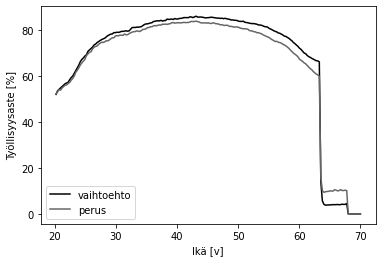

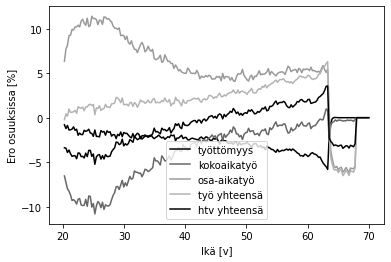

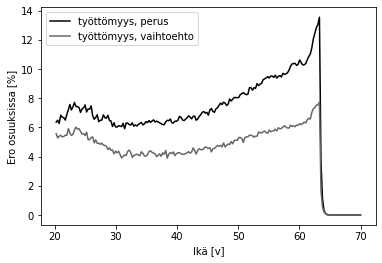

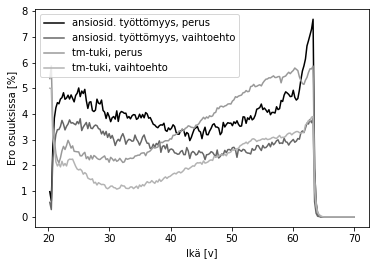

Työllisyysvaikutus 21-64-vuotiaisiin noin -21906 htv ja 77126 työllistä
Työllisiä 2092439 vs 2114345
Työllisyysastevaikutus 21-64-vuotiailla noin 2.58 prosenttia (78.22 vs 75.64)
epävarmuus työllisyysasteissa 0.0139, hajonta 0.0777


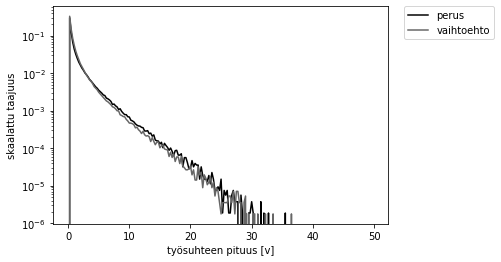

Jakauma ansiosidonnainen+tmtuki+putki, no max age
vaihtoehto keskikesto 0.4831897329244612 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 94243 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45537.25 v perus työtpäiviä yht 61623.25 v


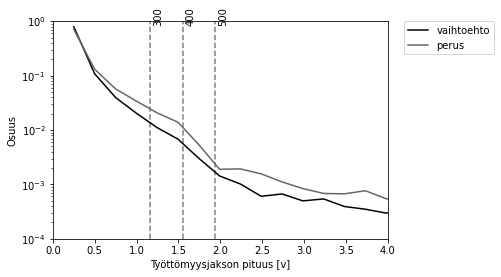

vaihtoehto keskikesto 0.4831897329244612 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 94243 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45537.25 v perus työtpäiviä yht 61623.25 v


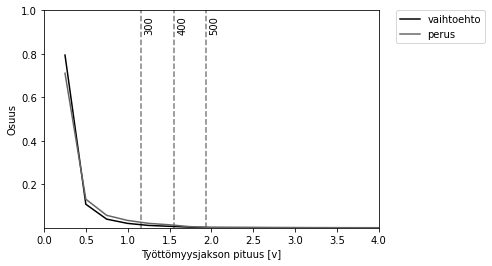

vaihtoehto keskikesto 0.4831897329244612 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 94243 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45537.25 v perus työtpäiviä yht 61623.25 v


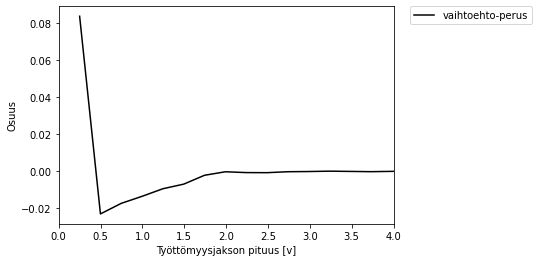

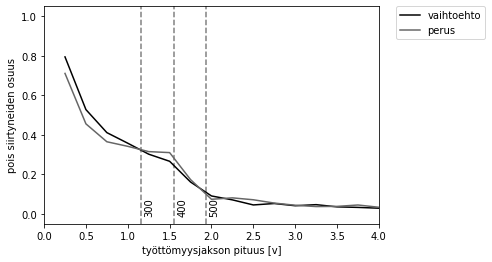

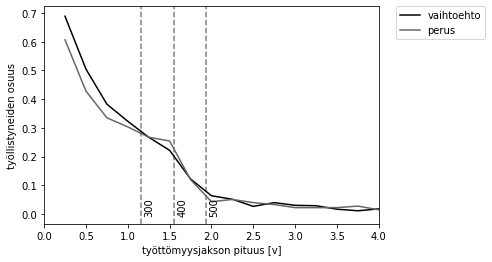

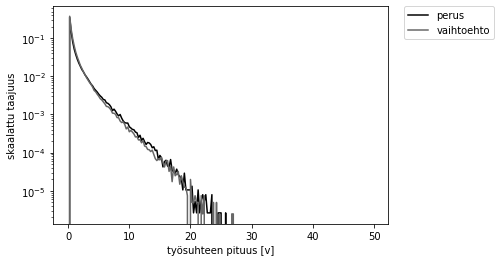

Jakauma ansiosidonnainen+tmtuki+putki, max age 54
vaihtoehto keskikesto 0.3572021508573694 v perus keskikesto 0.41592884986657813 v
Skaalaamaton vaihtoehto lkm 80712 v perus lkm 81321 v
Skaalaamaton vaihtoehto työtpäiviä yht 28830.5 v perus työtpäiviä yht 33823.75 v


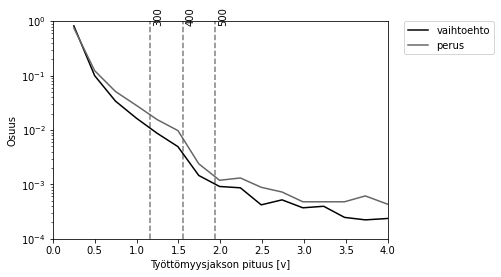

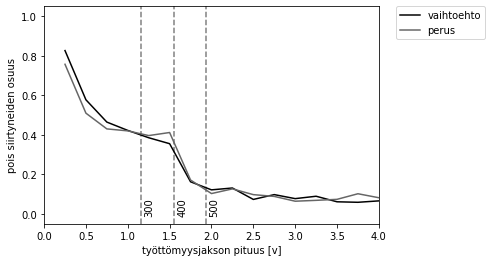

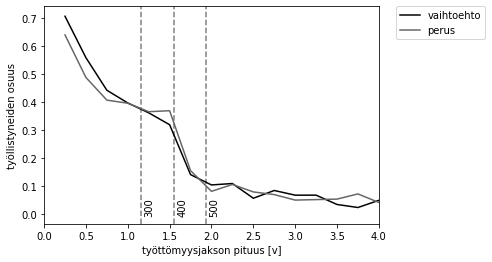

perus
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.87 |      0.11 |       0.02 |      0.00 |        0.00 |
| 30-39 |     0.85 |      0.11 |       0.04 |      0.00 |        0.00 |
| 40-49 |     0.84 |      0.12 |       0.04 |      0.00 |        0.00 |
| 50-59 |     0.79 |      0.14 |       0.06 |      0.00 |        0.00 |
| 60-65 |     0.65 |      0.17 |       0.09 |      0.05 |        0.05 |
+-------+----------+-----------+------------+-----------+-------------+
vaihtoehto
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.80 |      0.16 |       0.04 |      0.00 |        0.00 |
| 30-39 |     0.73 |      0.18 |       0.09 |  

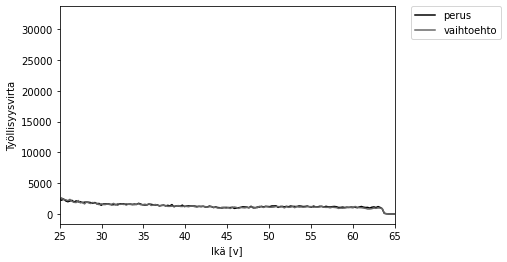

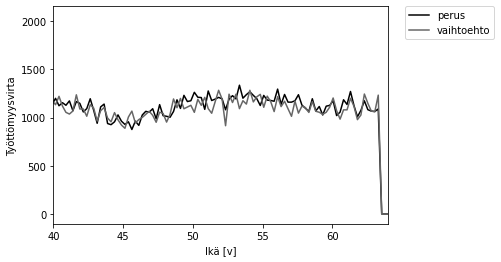

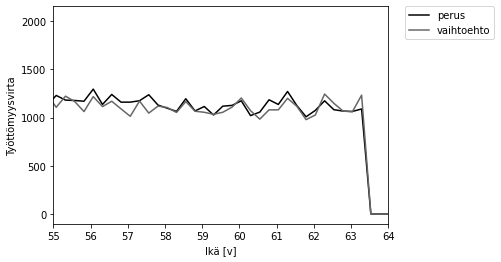

n_time= 202
n_time= 202


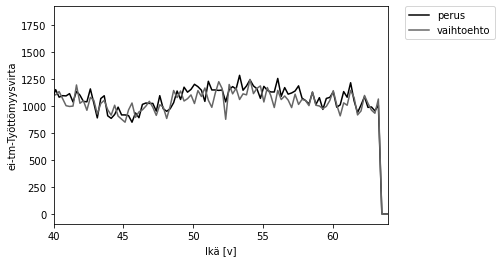

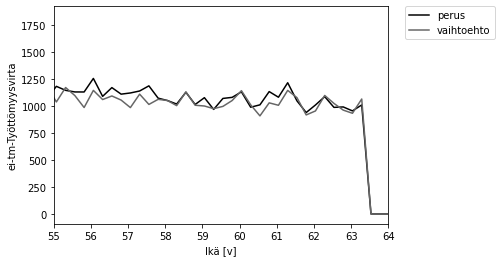

n_time= 202
n_time= 202


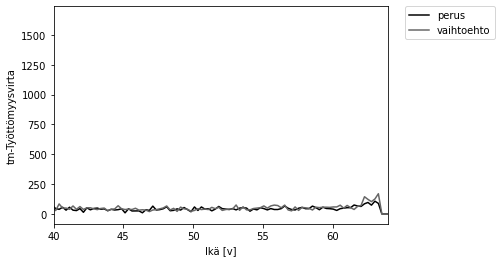

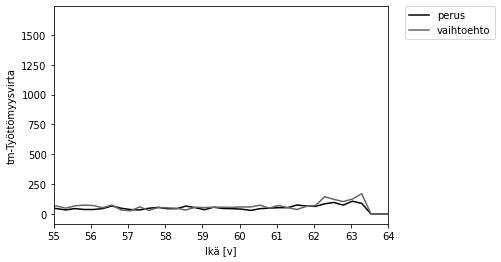

In [8]:
ptkok=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=False,
              randomness=randomness)
ptkok.load_sim(load=perustulokokeilu_results)
ptkok.compare_with(cc1)

## Perustulo

Alustava versio osittaisesta perustulosta.

In [6]:
cc1_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='tm')
cc1_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulomalli,plot=False,
                   results=perustuloresults,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875
training...
---------------------------------
| explained_variance | 0.998    |
| fps                | 2927     |
| nupdates           | 1        |
| policy_entropy     | 1.02     |
| policy_loss        | 0.0103   |
| total_timesteps    | 21816    |
| value_loss         | 0.028    |
---------------------------------
---------------------------------
| explained_variance | 0.945    |
| fps                | 3090     |
| nupdates           | 10       |
| policy_entropy     | 1.02     |
| policy_loss        | -0.0706  |
| total_timeste

---------------------------------
| explained_variance | 0.999    |
| fps                | 3030     |
| nupdates           | 260      |
| policy_entropy     | 1.03     |
| policy_loss        | -0.0165  |
| total_timesteps    | 5672160  |
| value_loss         | 0.013    |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3030     |
| nupdates           | 270      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.00754 |
| total_timesteps    | 5890320  |
| value_loss         | 0.0157   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3031     |
| nupdates           | 280      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.0166  |
| total_timesteps    | 6108480  |
| value_loss         | 0.0166   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+----------------------+--------------------+
|                  |                  e/v |              toteuma |                ero |
|------------------+----------------------+----------------------+--------------------|
| palkkatulo       | 88,120,003,548.34    | 89,134,200,000.00    |  -1,014,196,451.66 |
| etuusmeno        | 28,147,080,010.69    | 36,945,147,749.00    |  -8,798,067,738.31 |
| verot            | 45,917,233,081.19    | 30,763,000,000.00    |  15,154,233,081.19 |
| valtionvero      | 37,012,801,568.36    |  5,542,000,000.00    |  31,470,801,568.36 |
| kunnallisvero    |                 0.00 | 18,991,000,000.00    | -18,991,000,000.00 |
| ptel             |  5,490,258,351.02    |  5,560,000,000.00    |     -69,741,648.98 |
| tyotvakmaksu     |  1,674,280,067.42    |  1,693,549,800.00    |     -19,269,732.58 |
| ansiopvraha      |    721,606,254.83    |  3,895,333,045.00    |  -3,173,726,790.

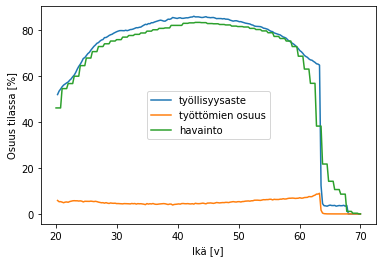

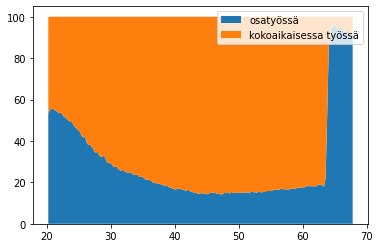

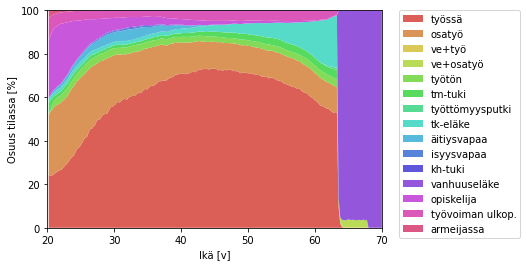

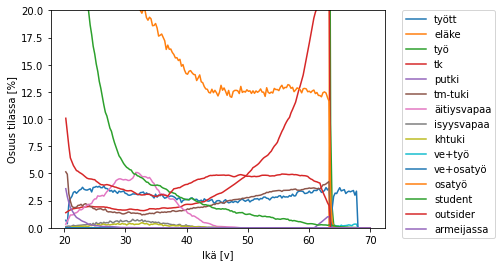

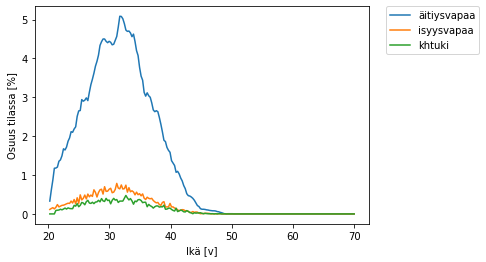

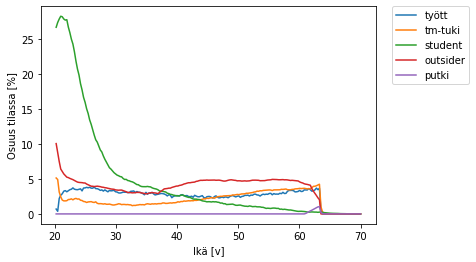

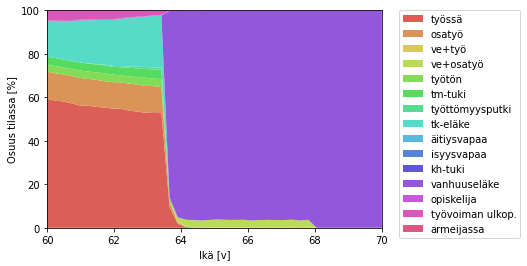

Lisäpäivillä on 1131 henkilöä


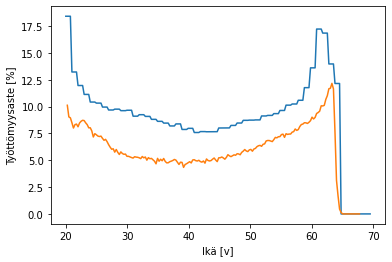

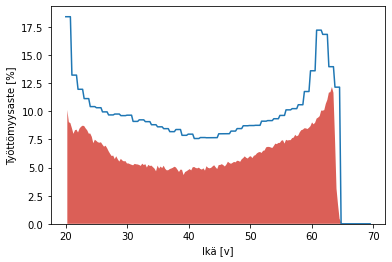

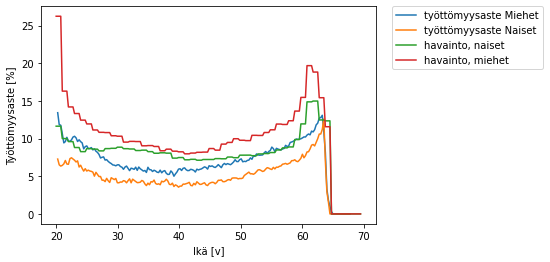

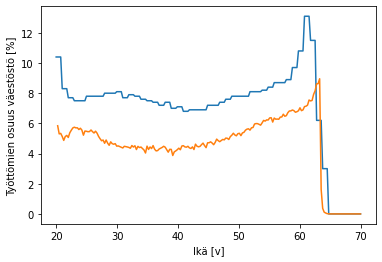

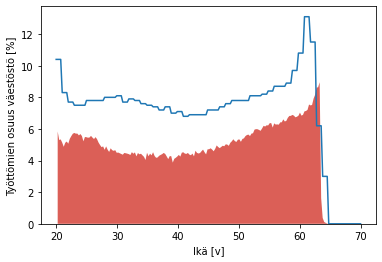

...

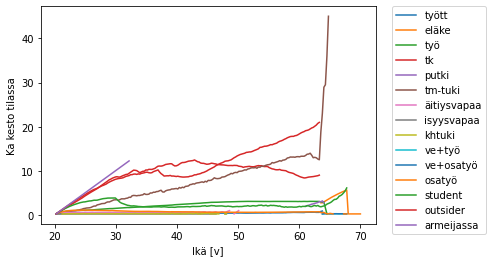

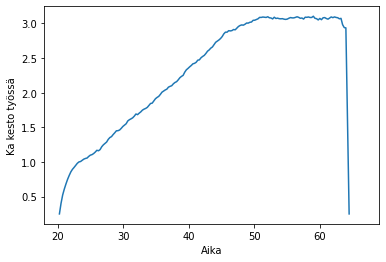

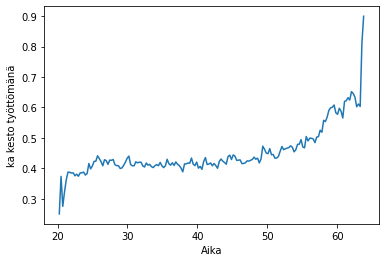

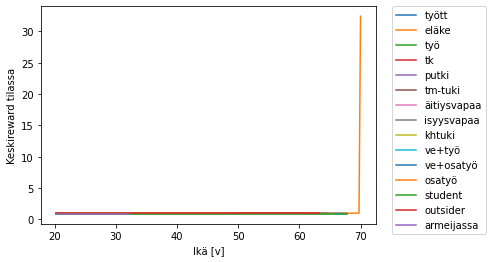

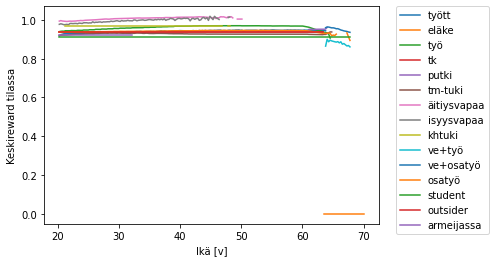

No handles with labels found to put in legend.


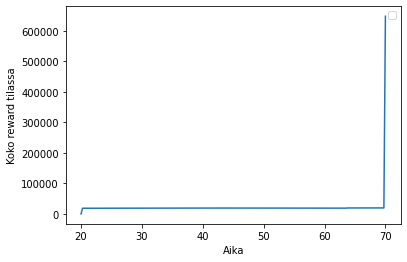

yhteensä reward 223.6100200827603


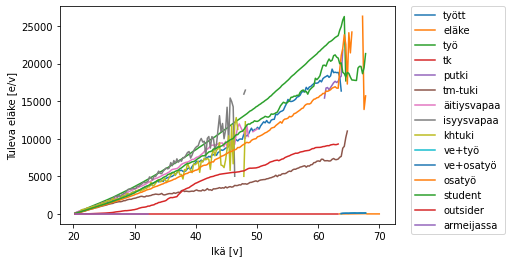

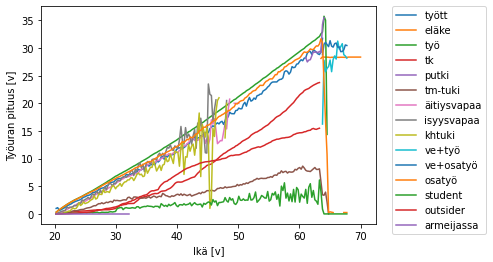

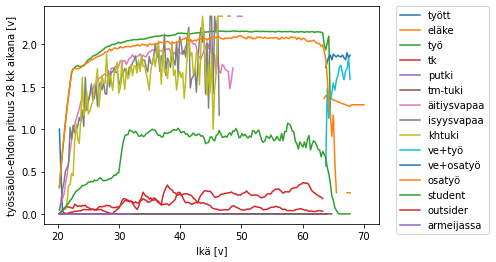

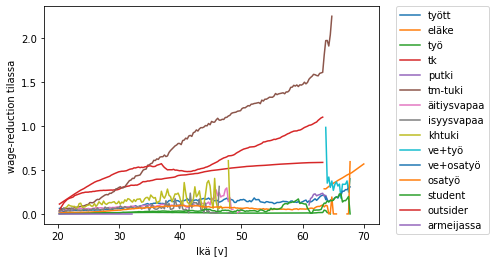

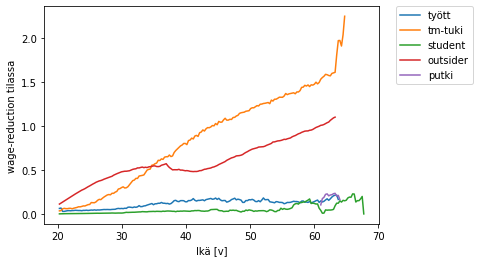

In [7]:
cc1_pt.render()

plotdebug False
No mortality included
False
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo False
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+-----------------------+-----------------------+
|                  |           vaihtoehto |                 perus |                   ero |
|------------------+----------------------+-----------------------+-----------------------|
| palkkatulo       | 88,120,003,548.34    |  89,421,388,349.21    |  -1,301,384,800.88    |
| etuusmeno        | 28,147,080,010.69    |  41,580,523,561.46    | -13,433,443,550.77    |
| verot            | 45,917,233,081.19    |  31,294,604,923.77    |  14,622,628,157.42    |
| valtionvero      | 37,012

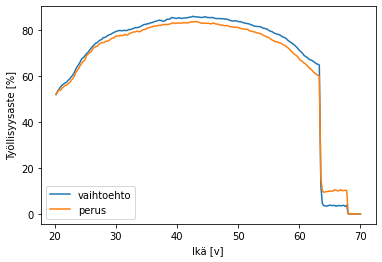

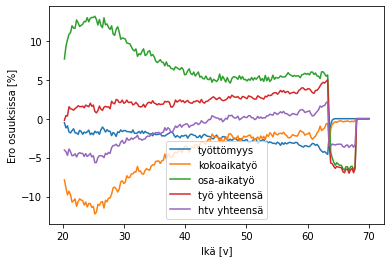

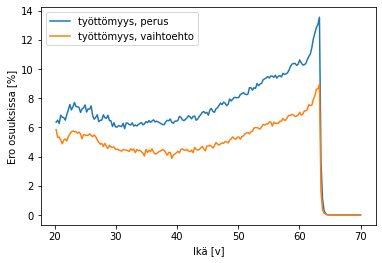

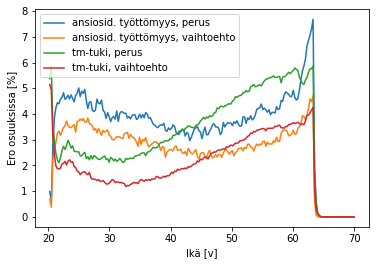

Työllisyysvaikutus 21-64-vuotiaisiin noin -35556 htv ja 74189 työllistä
Työllisiä 2078789 vs 2114345
Työllisyysastevaikutus 21-64-vuotiailla noin 2.48 prosenttia (78.12 vs 75.64)
epävarmuus työllisyysasteissa 0.0139, hajonta 0.0779


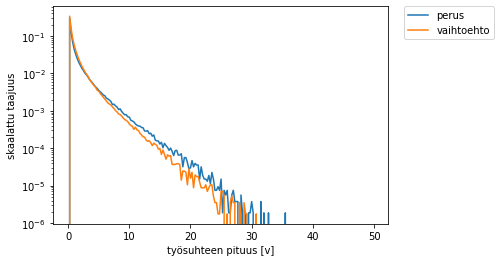

Jakauma ansiosidonnainen+tmtuki+putki, no max age
vaihtoehto keskikesto 0.498886654594458 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 94984 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 47386.25 v perus työtpäiviä yht 61623.25 v


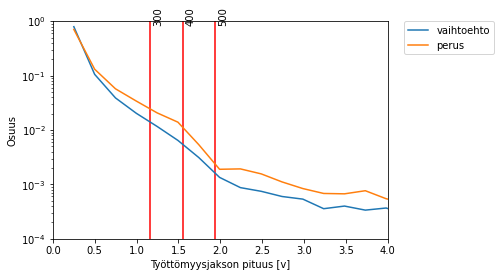

vaihtoehto keskikesto 0.498886654594458 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 94984 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 47386.25 v perus työtpäiviä yht 61623.25 v


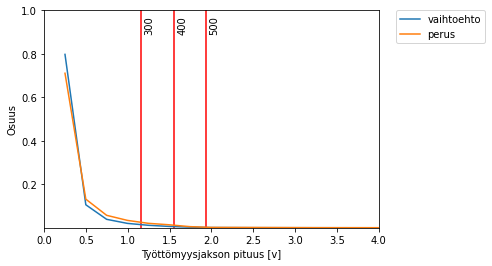

vaihtoehto keskikesto 0.498886654594458 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 94984 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 47386.25 v perus työtpäiviä yht 61623.25 v


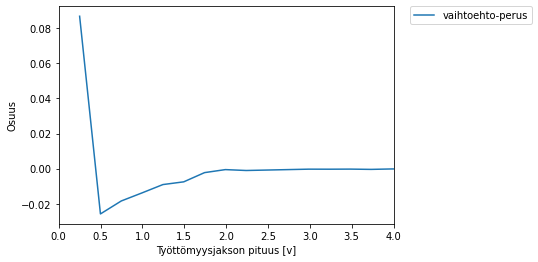

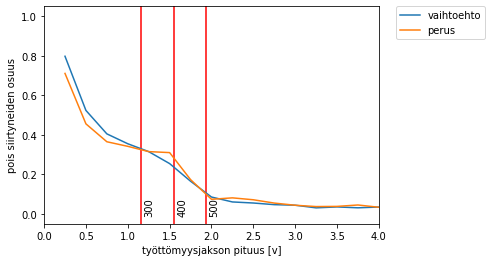

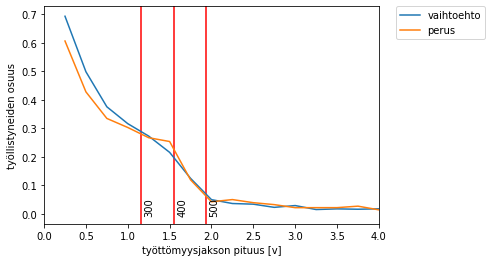

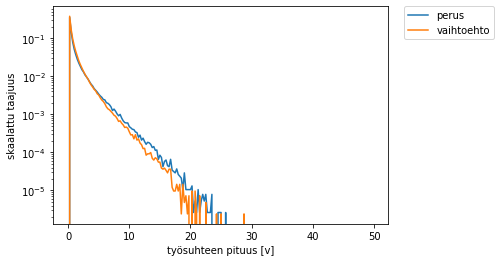

Jakauma ansiosidonnainen+tmtuki+putki, max age 54
vaihtoehto keskikesto 0.35184817786154476 v perus keskikesto 0.41592884986657813 v
Skaalaamaton vaihtoehto lkm 80647 v perus lkm 81321 v
Skaalaamaton vaihtoehto työtpäiviä yht 28375.5 v perus työtpäiviä yht 33823.75 v


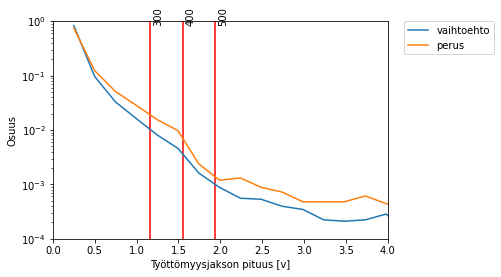

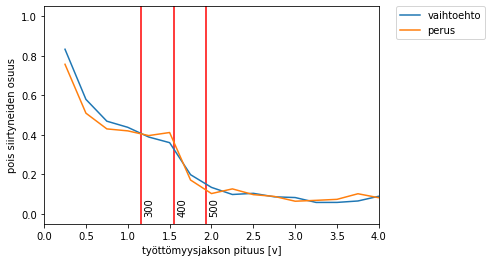

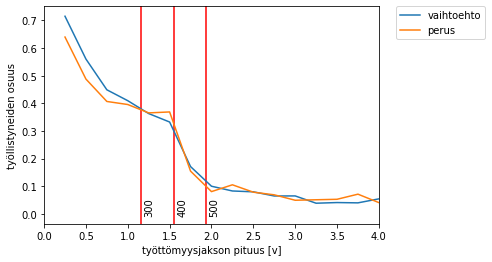

perus
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.85 |      0.12 |       0.03 |      0.00 |        0.00 |
| 30-39 |     0.84 |      0.11 |       0.04 |      0.00 |        0.00 |
| 40-49 |     0.85 |      0.11 |       0.04 |      0.00 |        0.00 |
| 50-59 |     0.78 |      0.15 |       0.07 |      0.00 |        0.00 |
| 60-65 |     0.61 |      0.17 |       0.10 |      0.05 |        0.07 |
+-------+----------+-----------+------------+-----------+-------------+
vaihtoehto
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.80 |      0.16 |       0.04 |      0.00 |        0.00 |
| 30-39 |     0.73 |      0.18 |       0.09 |  

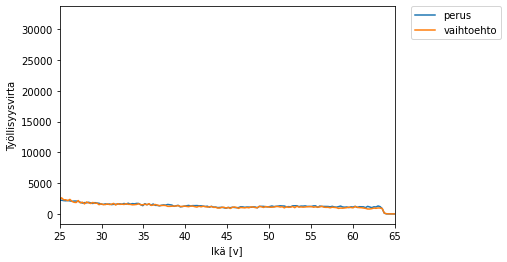

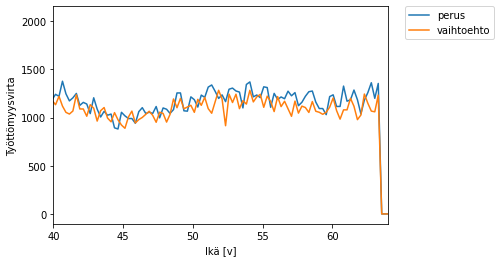

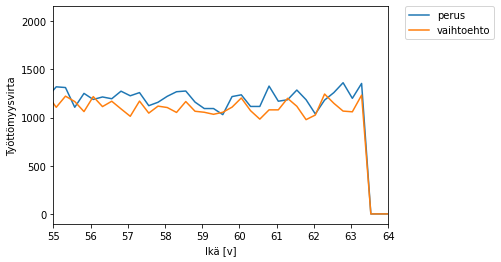

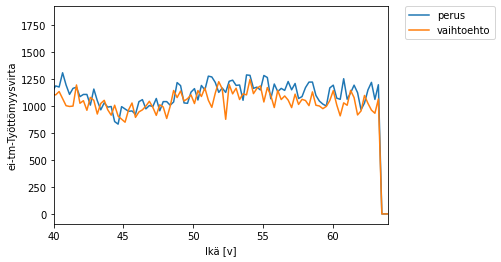

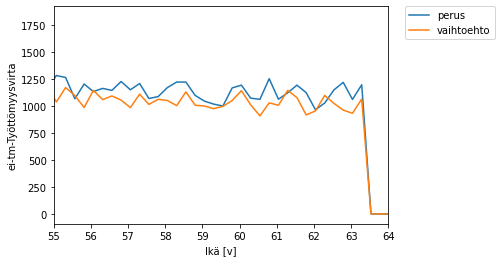

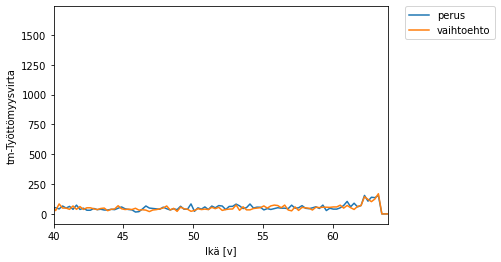

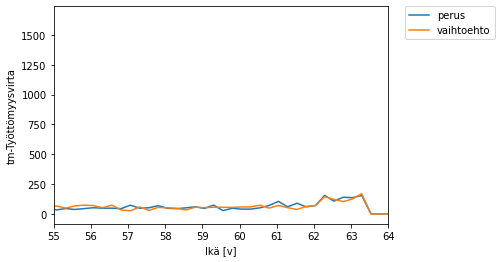

In [11]:
cc1_pt=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=False,
              randomness=randomness)
cc1_pt.load_sim(load=perustuloresults)
cc1_pt.compare_with(cc1)

# Kelan perustulomalli

In [14]:
cc2_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='Kela')
cc2_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulomalli,plot=False,
                   results=perustuloresults_kela,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)


plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875
training...
---------------------------------
| explained_variance | 0.998    |
| fps                | 2925     |
| nupdates           | 1        |
| policy_entropy     | 1        |
| policy_loss        | 0.00746  |
| total_timesteps    | 21816    |
| value_loss         | 0.0273   |
---------------------------------
---------------------------------
| explained_variance | 0.833    |
| fps                | 3086     |
| nupdates           | 10       |
| policy_entropy     | 1        |
| policy_loss        | -0.241   |
| total_timeste

---------------------------------
| explained_variance | 0.999    |
| fps                | 2996     |
| nupdates           | 260      |
| policy_entropy     | 1.03     |
| policy_loss        | -0.0157  |
| total_timesteps    | 5672160  |
| value_loss         | 0.0135   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 2997     |
| nupdates           | 270      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.00946 |
| total_timesteps    | 5890320  |
| value_loss         | 0.0119   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 2998     |
| nupdates           | 280      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.00675 |
| total_timesteps    | 6108480  |
| value_loss         | 0.0149   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+----------------------+--------------------+
|                  |                  e/v |              toteuma |                ero |
|------------------+----------------------+----------------------+--------------------|
| palkkatulo       | 89,373,161,130.03    | 89,134,200,000.00    |     238,961,130.03 |
| etuusmeno        | 28,035,338,943.13    | 36,945,147,749.00    |  -8,909,808,805.87 |
| verot            | 46,683,282,110.30    | 30,763,000,000.00    |  15,920,282,110.30 |
| valtionvero      | 37,647,934,689.19    |  5,542,000,000.00    |  32,105,934,689.19 |
| kunnallisvero    |                 0.00 | 18,991,000,000.00    | -18,991,000,000.00 |
| ptel             |  5,569,113,163.36    |  5,560,000,000.00    |       9,113,163.36 |
| tyotvakmaksu     |  1,698,090,061.47    |  1,693,549,800.00    |       4,540,261.47 |
| ansiopvraha      |    757,454,974.16    |  3,895,333,045.00    |  -3,137,878,070.

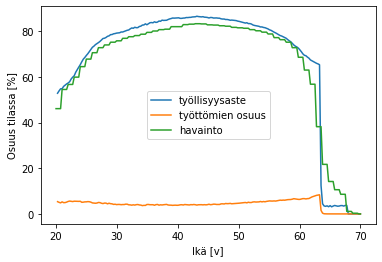

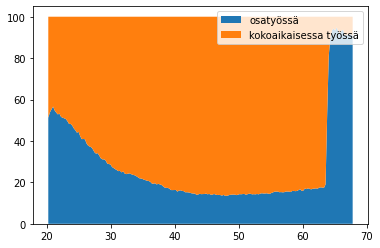

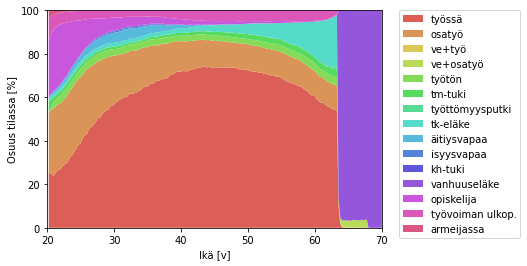

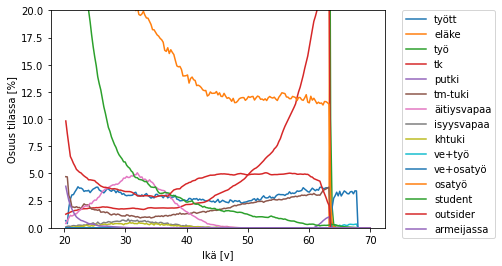

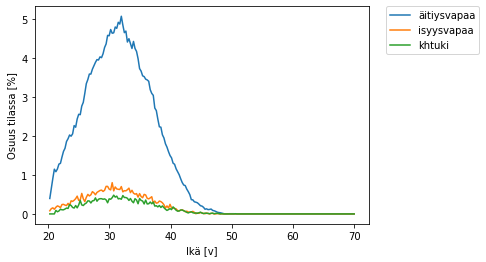

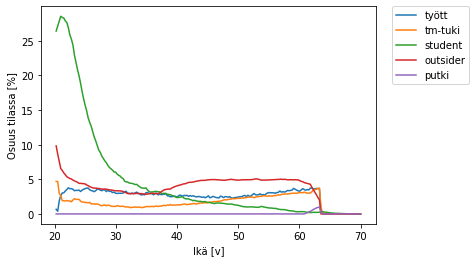

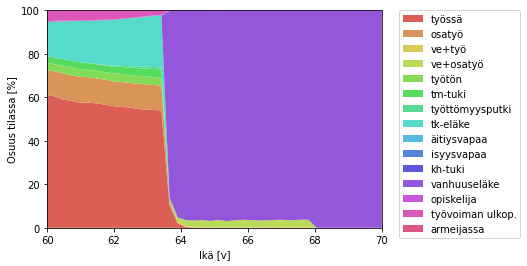

Lisäpäivillä on 1084 henkilöä


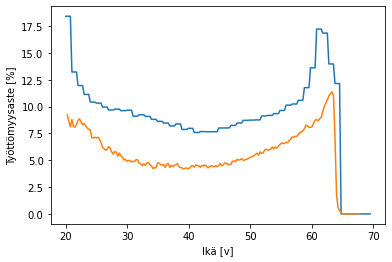

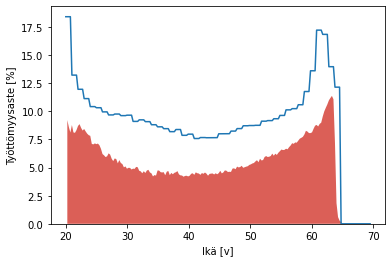

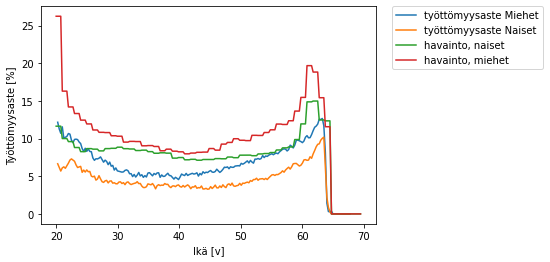

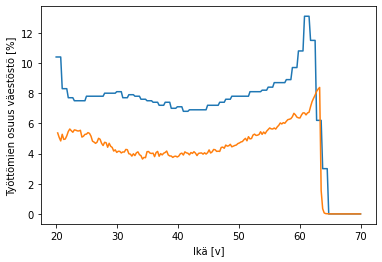

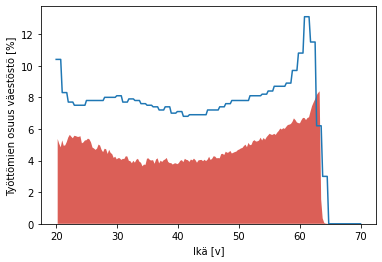

...

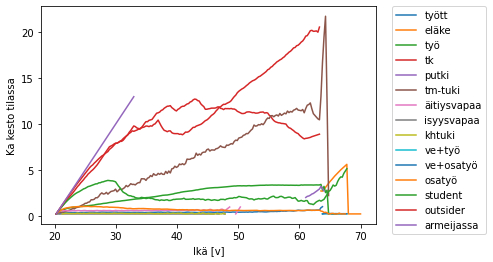

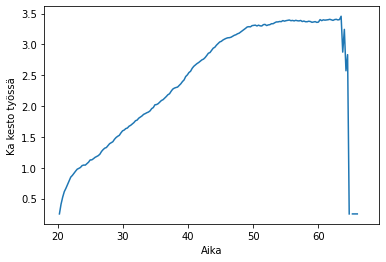

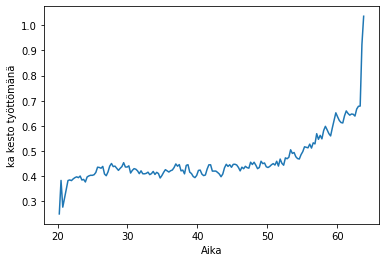

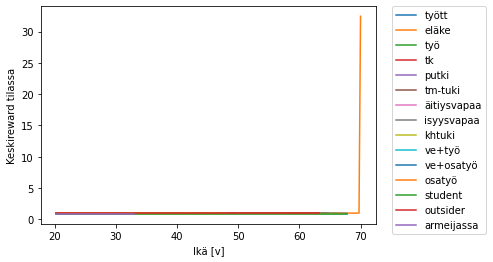

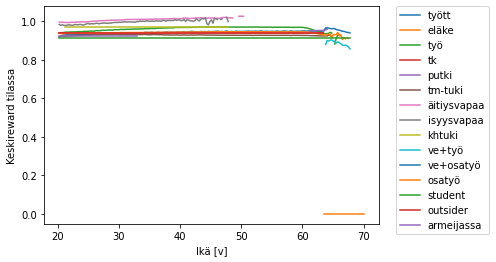

No handles with labels found to put in legend.


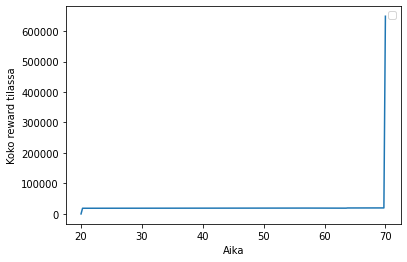

yhteensä reward 223.71552856470691


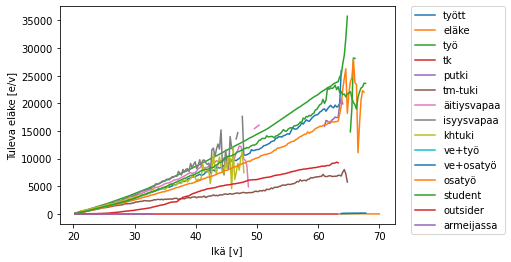

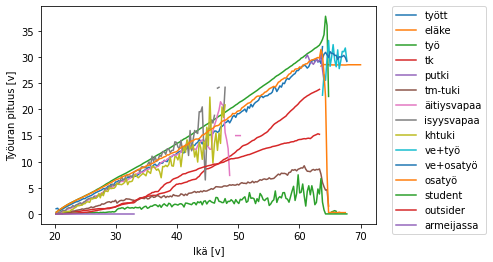

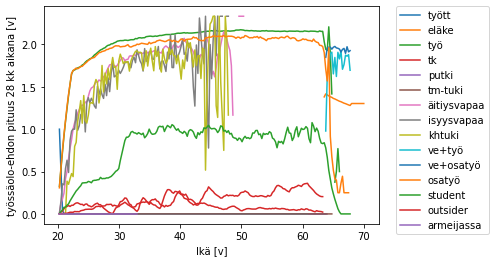

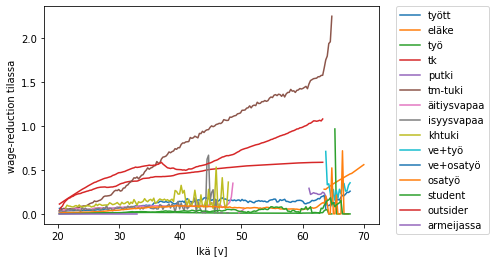

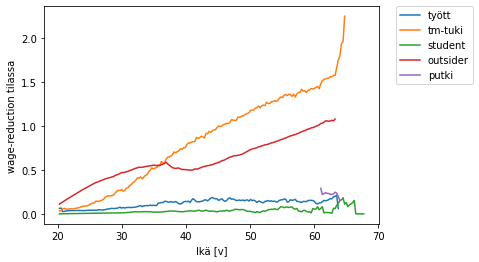

In [15]:
cc2_pt.render(load=perustuloresults_kela)

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+-----------------------+-----------------------+
|                  |           vaihtoehto |                 perus |                   ero |
|------------------+----------------------+-----------------------+-----------------------|
| palkkatulo       | 89,373,161,130.03    |  89,421,388,349.21    |     -48,227,219.18    |
| etuusmeno        | 28,035,338,943.13    |  41,580,523,561.46    | -13,545,184,618.33    |
| verot            | 46,683,282,110.30    |  31,294,604,923.77    |  15,388,677,186.53    |
| valtio

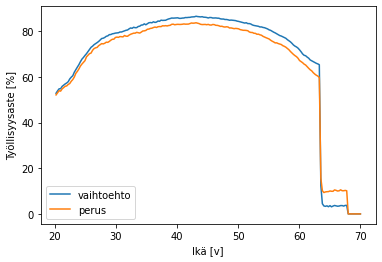

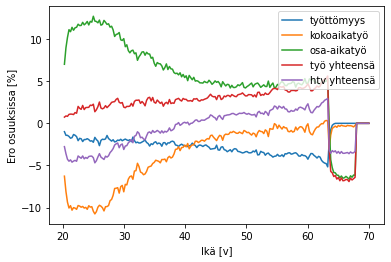

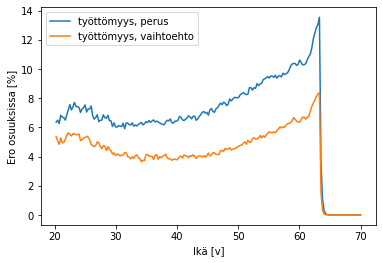

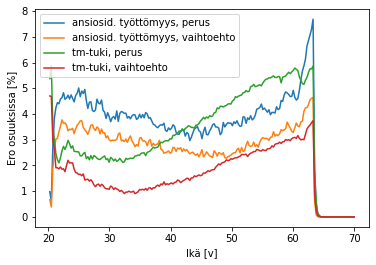

Työllisyysvaikutus 21-64-vuotiaisiin noin -11029 htv ja 90436 työllistä
Työllisiä 2103316 vs 2114345
Työllisyysastevaikutus 21-64-vuotiailla noin 3.02 prosenttia (78.66 vs 75.64)
epävarmuus työllisyysasteissa 0.0139, hajonta 0.0791


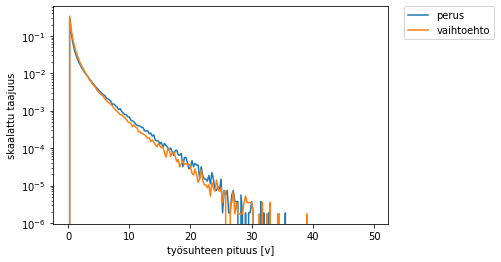

Jakauma ansiosidonnainen+tmtuki+putki, no max age
vaihtoehto keskikesto 0.47153660273145054 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 92698 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 43710.5 v perus työtpäiviä yht 61623.25 v


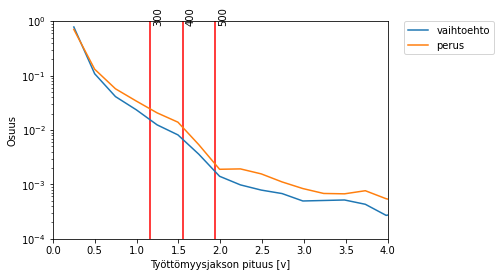

vaihtoehto keskikesto 0.47153660273145054 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 92698 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 43710.5 v perus työtpäiviä yht 61623.25 v


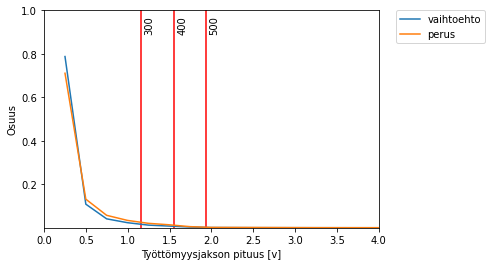

vaihtoehto keskikesto 0.47153660273145054 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 92698 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 43710.5 v perus työtpäiviä yht 61623.25 v


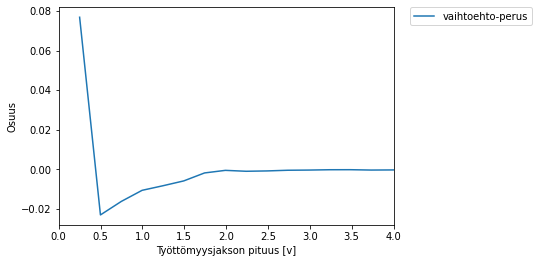

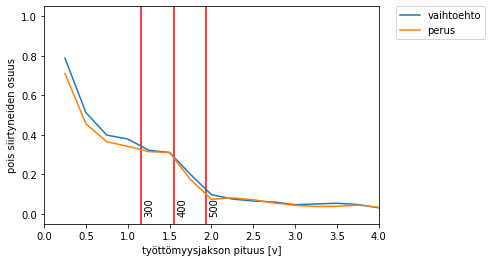

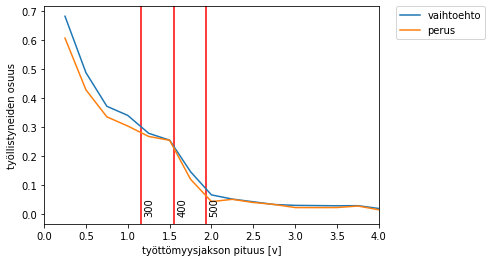

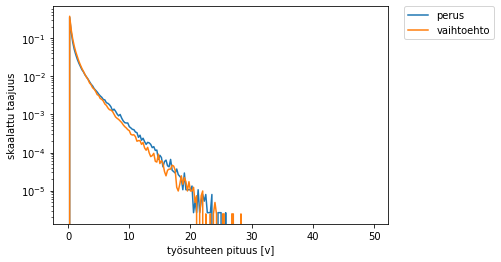

Jakauma ansiosidonnainen+tmtuki+putki, max age 54
vaihtoehto keskikesto 0.35241414269420857 v perus keskikesto 0.41592884986657813 v
Skaalaamaton vaihtoehto lkm 78910 v perus lkm 81321 v
Skaalaamaton vaihtoehto työtpäiviä yht 27809.0 v perus työtpäiviä yht 33823.75 v


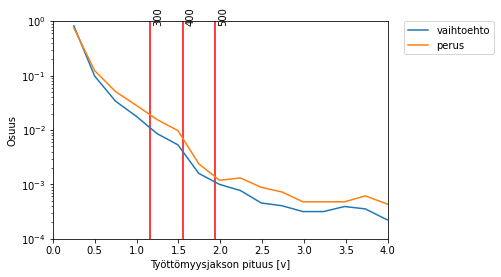

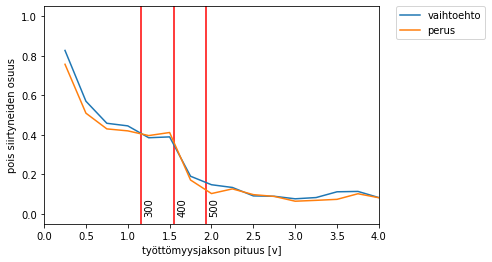

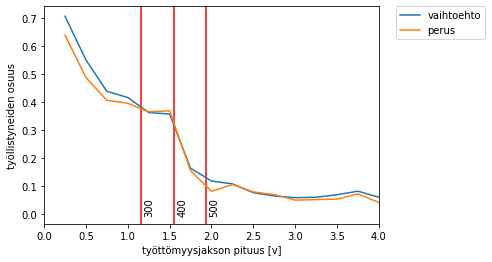

perus
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.85 |      0.13 |       0.02 |      0.00 |        0.00 |
| 30-39 |     0.83 |      0.12 |       0.05 |      0.00 |        0.00 |
| 40-49 |     0.84 |      0.11 |       0.05 |      0.00 |        0.00 |
| 50-59 |     0.76 |      0.16 |       0.07 |      0.00 |        0.00 |
| 60-65 |     0.59 |      0.20 |       0.10 |      0.05 |        0.06 |
+-------+----------+-----------+------------+-----------+-------------+
vaihtoehto
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.80 |      0.16 |       0.04 |      0.00 |        0.00 |
| 30-39 |     0.73 |      0.18 |       0.09 |  

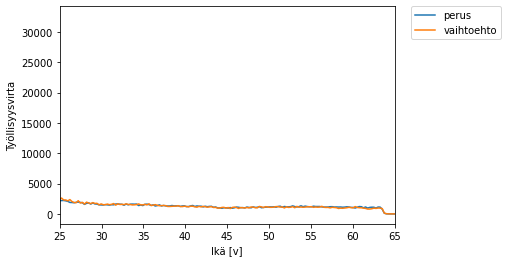

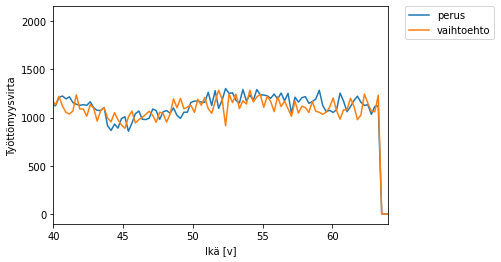

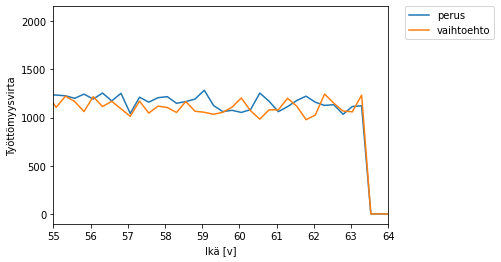

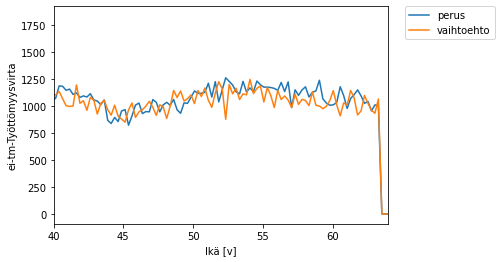

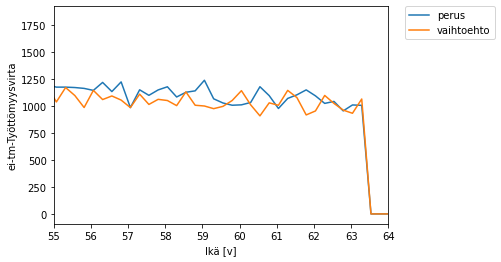

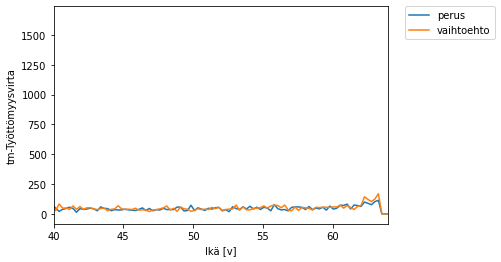

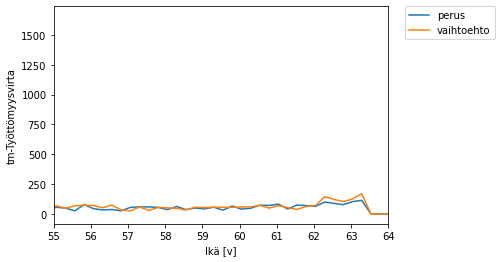

In [16]:
cc2_pt=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=True,
              randomness=randomness)
cc2_pt.load_sim(load=perustuloresults_kela)
cc2_pt.compare_with(cc1)

# Vihreiden perustulomalli

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875
training...
---------------------------------
| explained_variance | 0.997    |
| fps                | 2929     |
| nupdates           | 1        |
| policy_entropy     | 1.01     |
| policy_loss        | 0.00899  |
| total_timesteps    | 21816    |
| value_loss         | 0.0326   |
---------------------------------
---------------------------------
| explained_variance | 0.931    |
| fps                | 3119     |
| nupdates           | 10       |
| policy_entropy     | 1.01     |
| policy_loss        | 0.22     |
| total_timeste

---------------------------------
| explained_variance | 0.999    |
| fps                | 3033     |
| nupdates           | 260      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.0127  |
| total_timesteps    | 5672160  |
| value_loss         | 0.0127   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3033     |
| nupdates           | 270      |
| policy_entropy     | 1.03     |
| policy_loss        | -0.0148  |
| total_timesteps    | 5890320  |
| value_loss         | 0.0126   |
---------------------------------
---------------------------------
| explained_variance | 0.998    |
| fps                | 3033     |
| nupdates           | 280      |
| policy_entropy     | 1.02     |
| policy_loss        | -0.0172  |
| total_timesteps    | 6108480  |
| value_loss         | 0.0203   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+----------------------+--------------------+
|                  |                  e/v |              toteuma |                ero |
|------------------+----------------------+----------------------+--------------------|
| palkkatulo       | 89,163,171,254.55    | 89,134,200,000.00    |      28,971,254.55 |
| etuusmeno        | 28,065,105,575.85    | 36,945,147,749.00    |  -8,880,042,173.15 |
| verot            | 46,594,151,898.81    | 30,763,000,000.00    |  15,831,151,898.81 |
| valtionvero      | 37,581,141,397.24    |  5,542,000,000.00    |  32,039,141,397.24 |
| kunnallisvero    |                 0.00 | 18,991,000,000.00    | -18,991,000,000.00 |
| ptel             |  5,555,961,852.98    |  5,560,000,000.00    |      -4,038,147.02 |
| tyotvakmaksu     |  1,694,100,253.84    |  1,693,549,800.00    |         550,453.84 |
| ansiopvraha      |    735,372,194.20    |  3,895,333,045.00    |  -3,159,960,850.

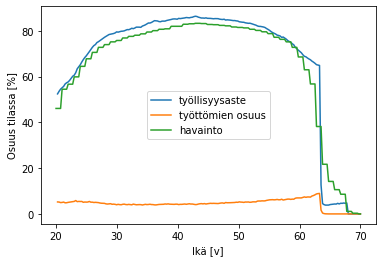

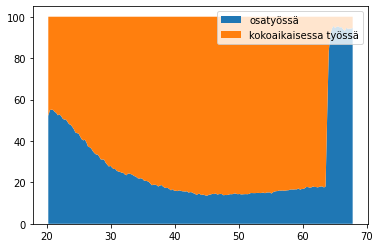

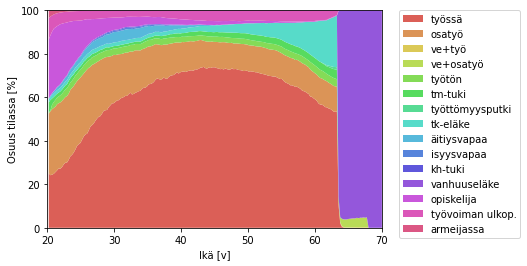

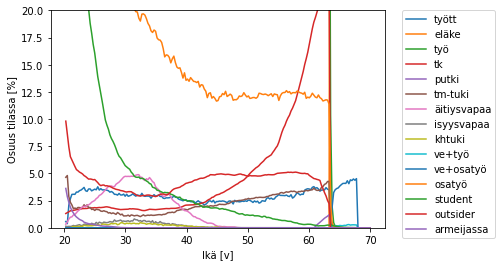

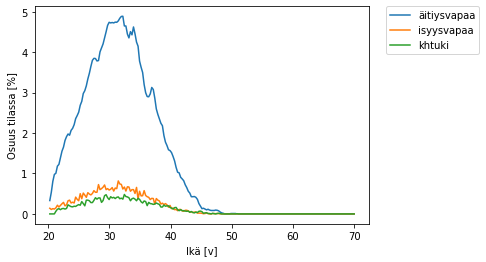

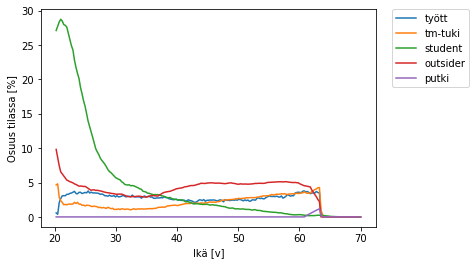

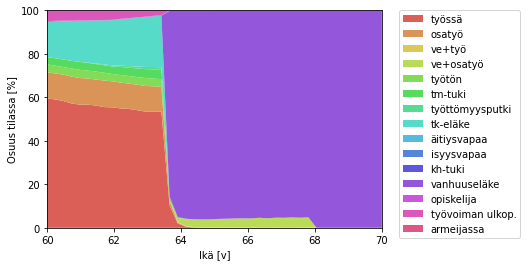

Lisäpäivillä on 1304 henkilöä


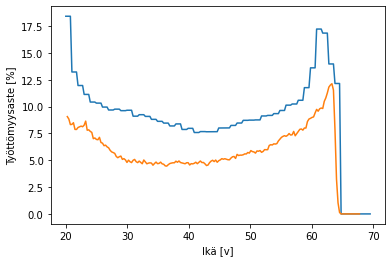

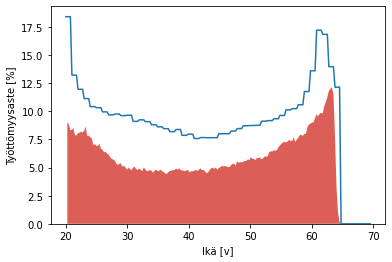

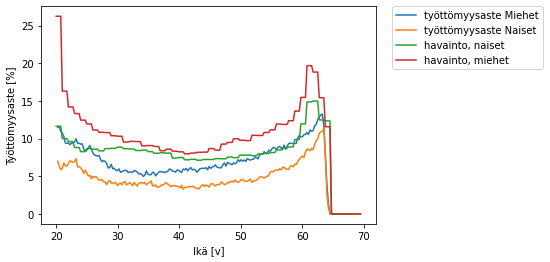

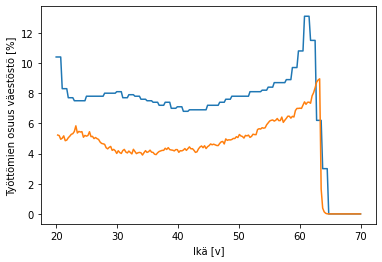

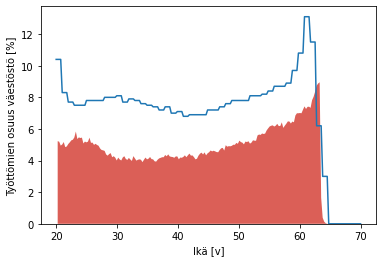

...

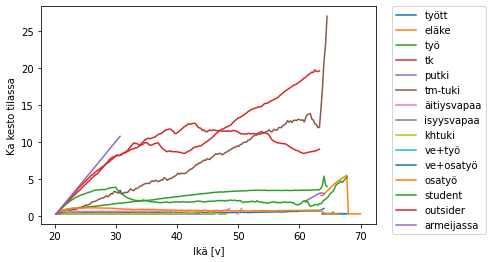

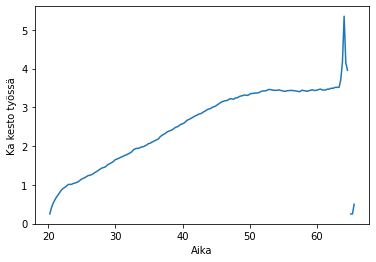

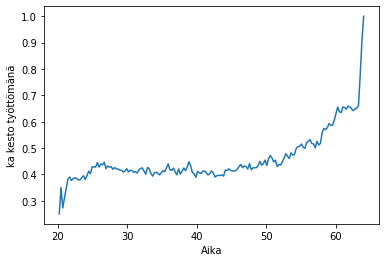

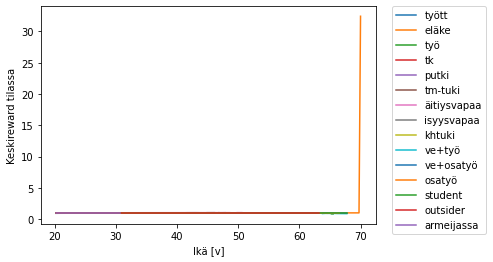

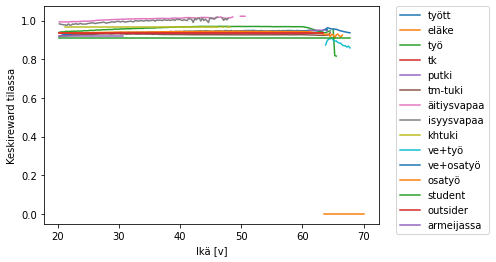

No handles with labels found to put in legend.


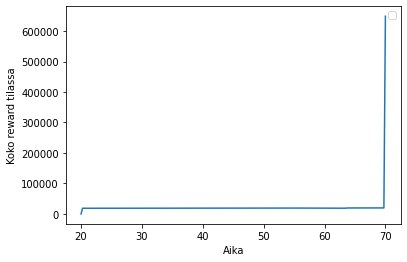

yhteensä reward 223.70485827091215


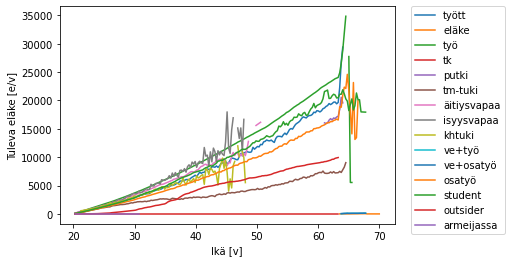

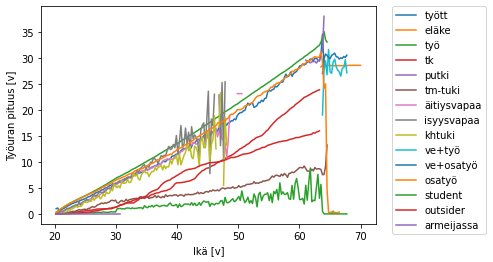

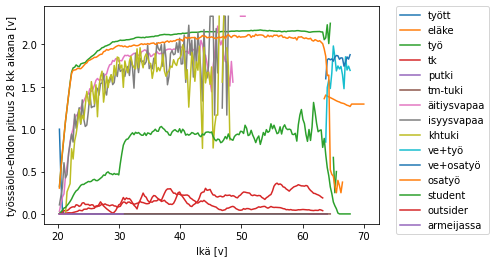

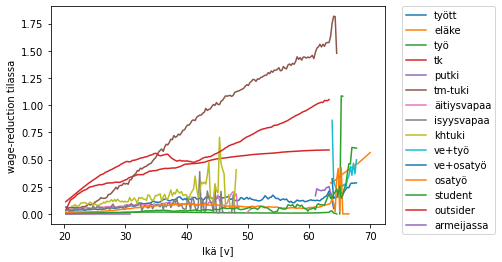

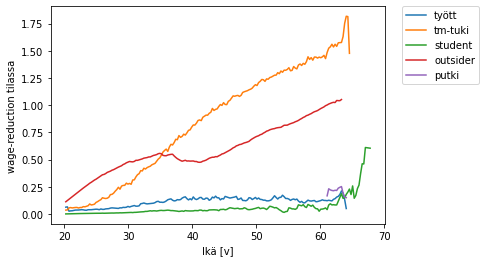

In [17]:
cc3_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='vihreat')
cc3_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulomalli_vihreat,plot=False,
                   results=perustuloresults_vihreat,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)
cc3_pt.render()

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+-----------------------+-----------------------+
|                  |           vaihtoehto |                 perus |                   ero |
|------------------+----------------------+-----------------------+-----------------------|
| palkkatulo       | 89,163,171,254.55    |  89,421,388,349.21    |    -258,217,094.66    |
| etuusmeno        | 28,065,105,575.85    |  41,580,523,561.46    | -13,515,417,985.61    |
| verot            | 46,594,151,898.81    |  31,294,604,923.77    |  15,299,546,975.04    |
| valtio

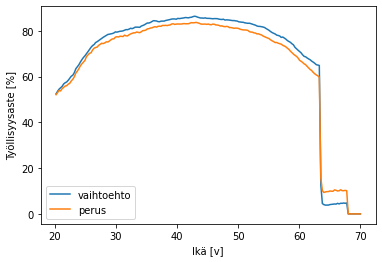

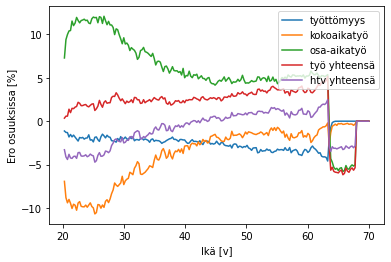

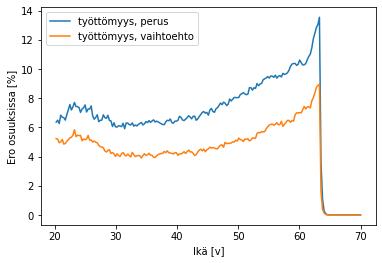

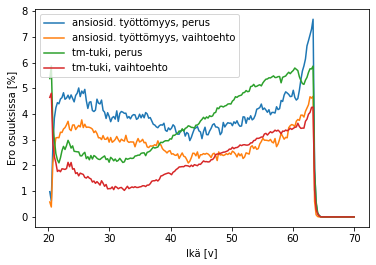

Työllisyysvaikutus 21-64-vuotiaisiin noin -17573 htv ja 83644 työllistä
Työllisiä 2096772 vs 2114345
Työllisyysastevaikutus 21-64-vuotiailla noin 2.79 prosenttia (78.44 vs 75.64)
epävarmuus työllisyysasteissa 0.0139, hajonta 0.0785


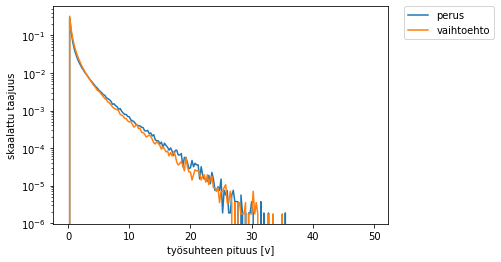

Jakauma ansiosidonnainen+tmtuki+putki, no max age
vaihtoehto keskikesto 0.49272810860511657 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 92445 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45550.25 v perus työtpäiviä yht 61623.25 v


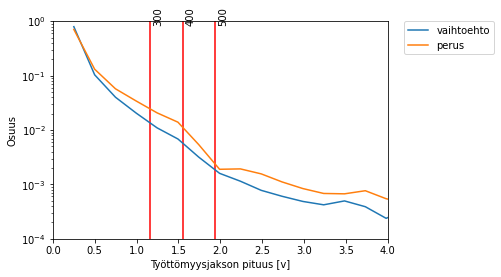

vaihtoehto keskikesto 0.49272810860511657 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 92445 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45550.25 v perus työtpäiviä yht 61623.25 v


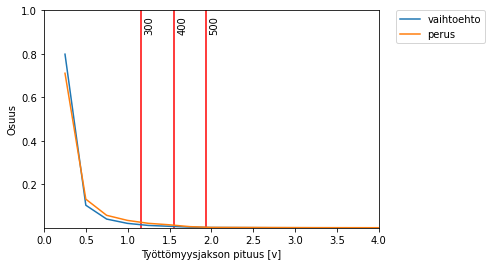

vaihtoehto keskikesto 0.49272810860511657 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 92445 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45550.25 v perus työtpäiviä yht 61623.25 v


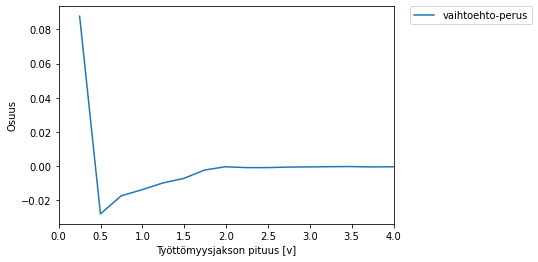

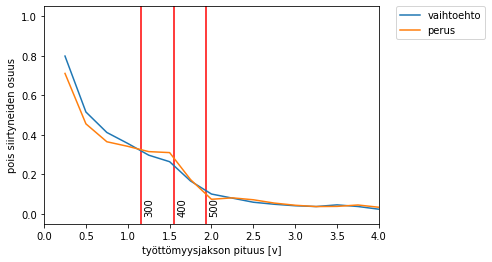

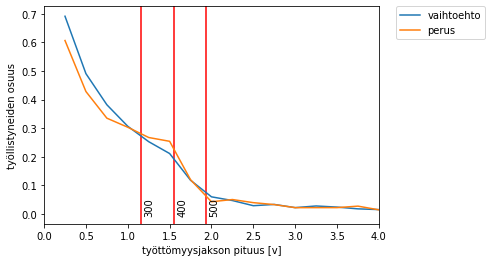

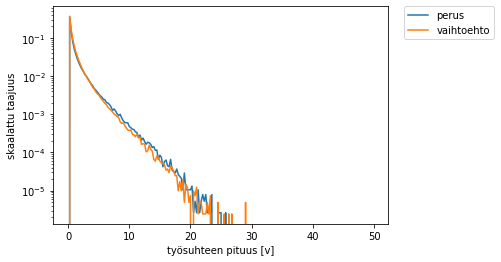

Jakauma ansiosidonnainen+tmtuki+putki, max age 54
vaihtoehto keskikesto 0.3487020165440476 v perus keskikesto 0.41592884986657813 v
Skaalaamaton vaihtoehto lkm 78699 v perus lkm 81321 v
Skaalaamaton vaihtoehto työtpäiviä yht 27442.5 v perus työtpäiviä yht 33823.75 v


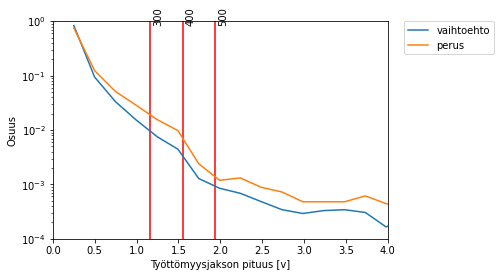

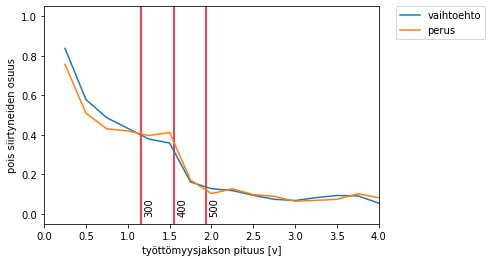

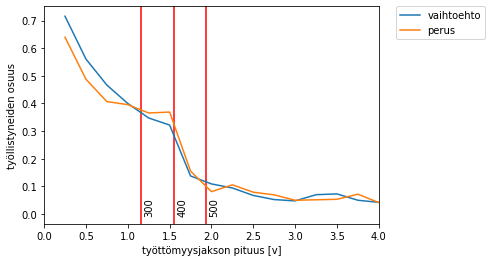

perus
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.85 |      0.13 |       0.03 |      0.00 |        0.00 |
| 30-39 |     0.85 |      0.11 |       0.04 |      0.00 |        0.00 |
| 40-49 |     0.85 |      0.10 |       0.04 |      0.00 |        0.00 |
| 50-59 |     0.77 |      0.15 |       0.07 |      0.00 |        0.00 |
| 60-65 |     0.58 |      0.18 |       0.10 |      0.06 |        0.07 |
+-------+----------+-----------+------------+-----------+-------------+
vaihtoehto
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.80 |      0.16 |       0.04 |      0.00 |        0.00 |
| 30-39 |     0.73 |      0.18 |       0.09 |  

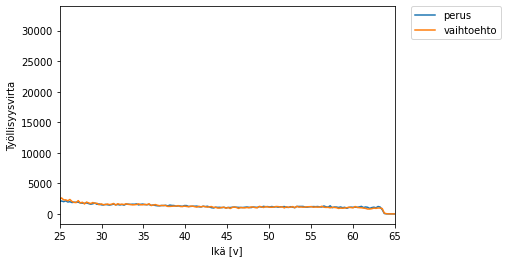

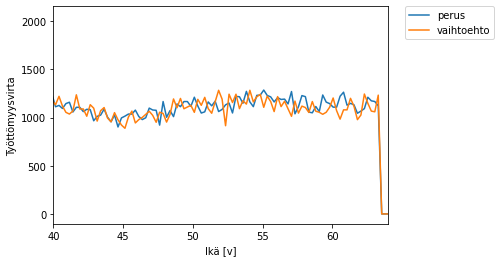

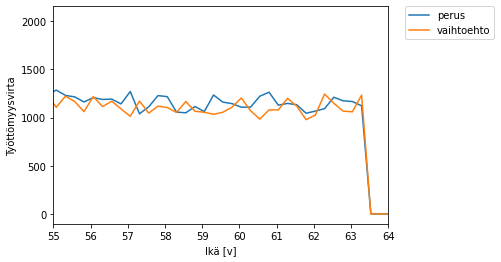

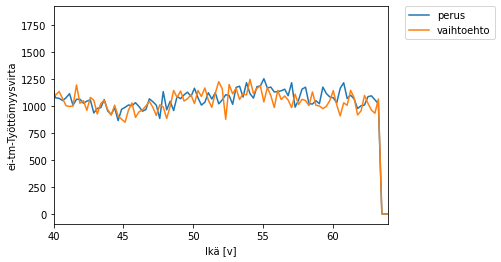

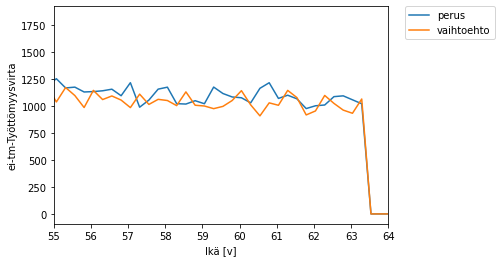

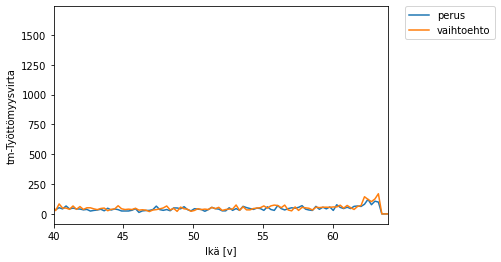

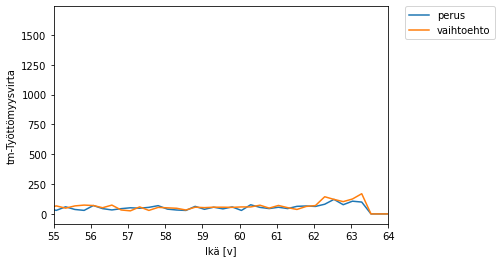

In [18]:
cc3_pt=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=True,
              randomness=randomness)
cc3_pt.load_sim(load=perustuloresults_vihreat)
cc3_pt.compare_with(cc1)

# Vasemmistoliiton perustulomalli

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875
training...
---------------------------------
| explained_variance | 0.997    |
| fps                | 2868     |
| nupdates           | 1        |
| policy_entropy     | 1.03     |
| policy_loss        | 0.0146   |
| total_timesteps    | 21816    |
| value_loss         | 0.0338   |
---------------------------------
---------------------------------
| explained_variance | 0.805    |
| fps                | 3013     |
| nupdates           | 10       |
| policy_entropy     | 0.981    |
| policy_loss        | -1.19    |
| total_timeste

---------------------------------
| explained_variance | 0.998    |
| fps                | 2990     |
| nupdates           | 260      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.0136  |
| total_timesteps    | 5672160  |
| value_loss         | 0.025    |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 2991     |
| nupdates           | 270      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.011   |
| total_timesteps    | 5890320  |
| value_loss         | 0.0107   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 2992     |
| nupdates           | 280      |
| policy_entropy     | 1.03     |
| policy_loss        | -0.0151  |
| total_timesteps    | 6108480  |
| value_loss         | 0.0132   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+----------------------+--------------------+
|                  |                  e/v |              toteuma |                ero |
|------------------+----------------------+----------------------+--------------------|
| palkkatulo       | 89,335,314,406.09    | 89,134,200,000.00    |     201,114,406.09 |
| etuusmeno        | 56,516,039,934.09    | 36,945,147,749.00    |  19,570,892,185.09 |
| verot            | 46,691,677,217.66    | 30,763,000,000.00    |  15,928,677,217.66 |
| valtionvero      | 37,660,899,316.86    |  5,542,000,000.00    |  32,118,899,316.86 |
| kunnallisvero    |                 0.00 | 18,991,000,000.00    | -18,991,000,000.00 |
| ptel             |  5,566,933,338.55    |  5,560,000,000.00    |       6,933,338.55 |
| tyotvakmaksu     |  1,697,370,973.72    |  1,693,549,800.00    |       3,821,173.72 |
| ansiopvraha      |    758,249,570.03    |  3,895,333,045.00    |  -3,137,083,474.

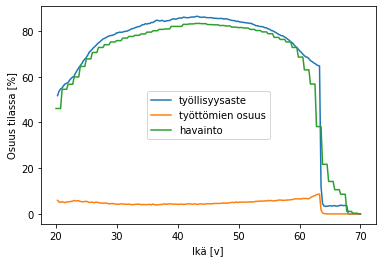

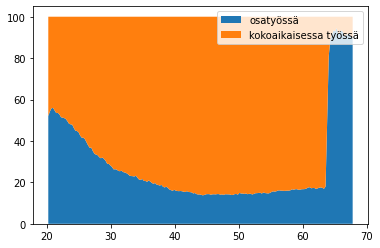

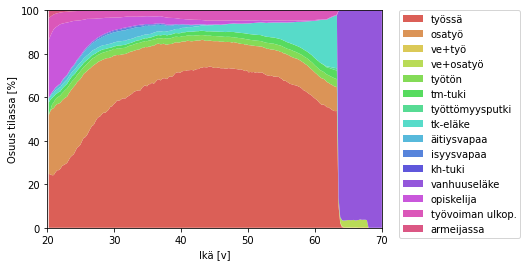

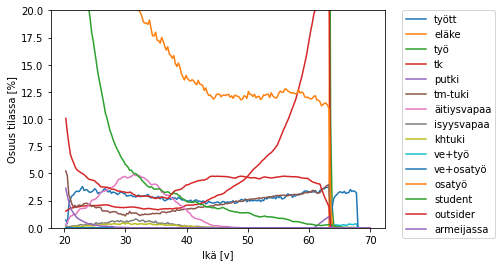

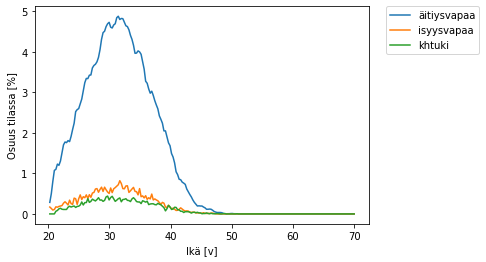

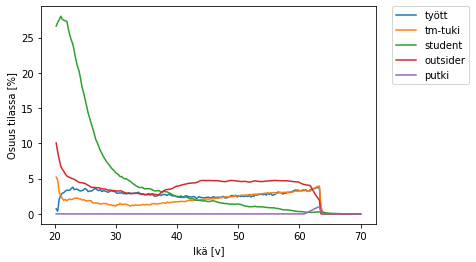

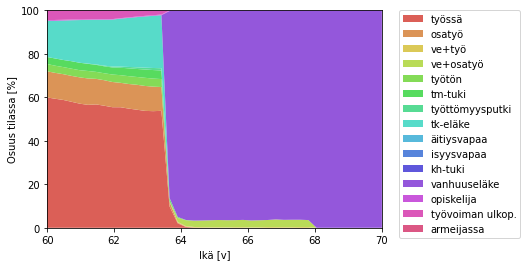

Lisäpäivillä on 1125 henkilöä


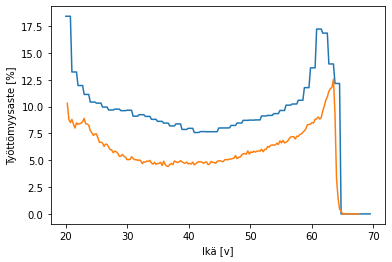

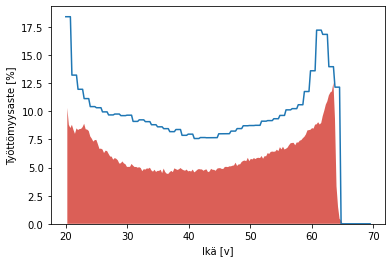

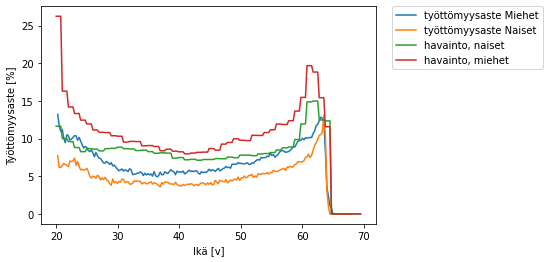

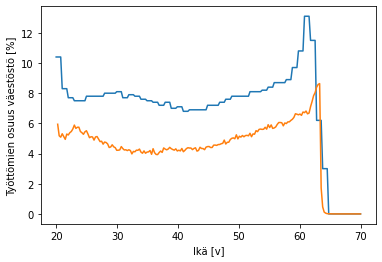

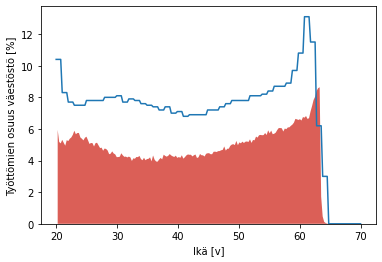

...

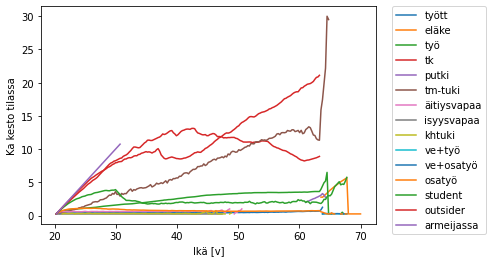

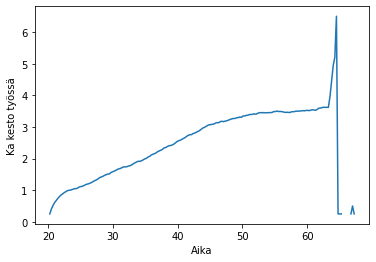

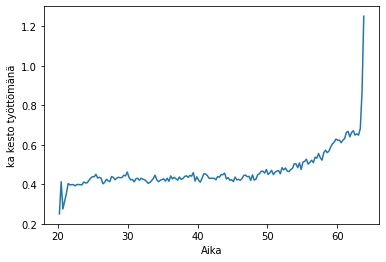

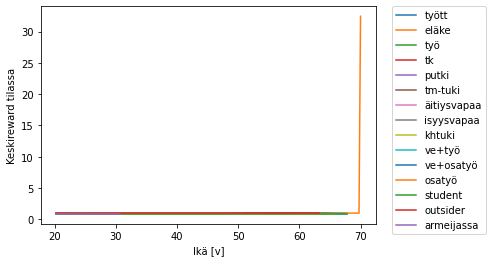

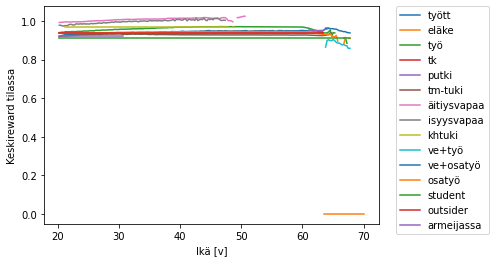

No handles with labels found to put in legend.


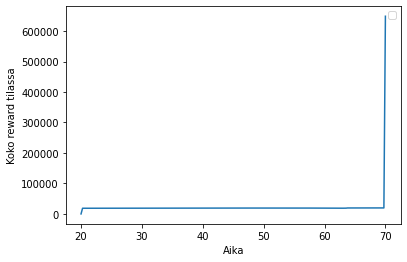

yhteensä reward 223.7341803943092


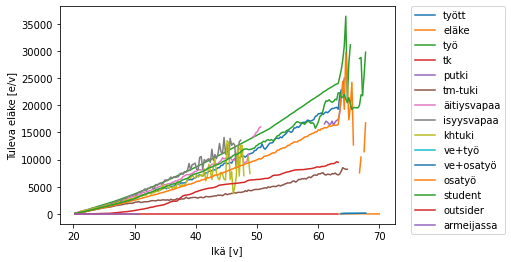

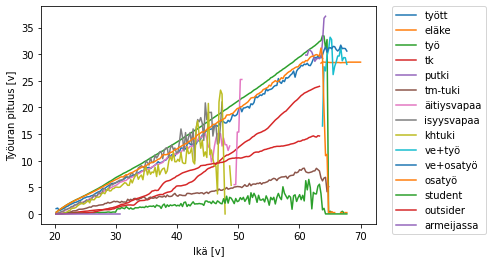

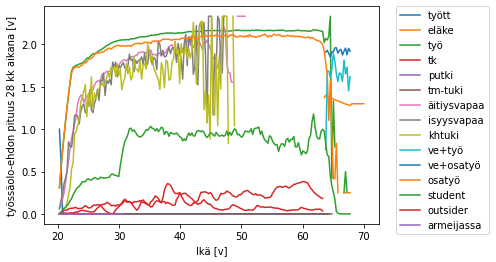

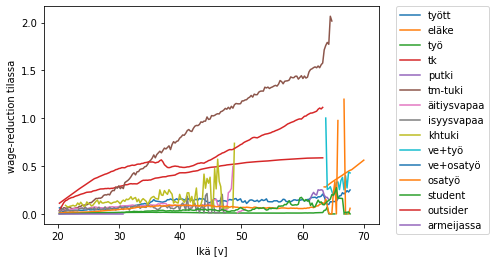

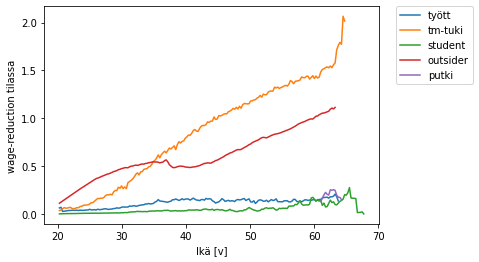

In [19]:
cc4_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='vasemmistoliitto')
cc4_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulomalli,plot=False,
                   results=perustuloresults_vasemmistoliitto,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)
cc4_pt.render()

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+-----------------------+-----------------------+
|                  |           vaihtoehto |                 perus |                   ero |
|------------------+----------------------+-----------------------+-----------------------|
| palkkatulo       | 89,335,314,406.09    |  89,421,388,349.21    |     -86,073,943.12    |
| etuusmeno        | 56,516,039,934.09    |  41,580,523,561.46    |  14,935,516,372.63    |
| verot            | 46,691,677,217.66    |  31,294,604,923.77    |  15,397,072,293.88    |
| valtio

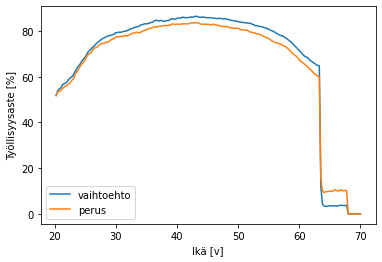

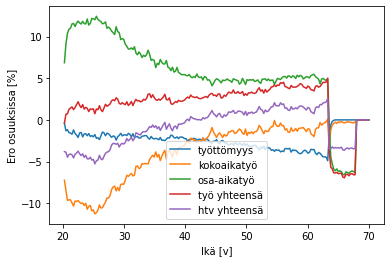

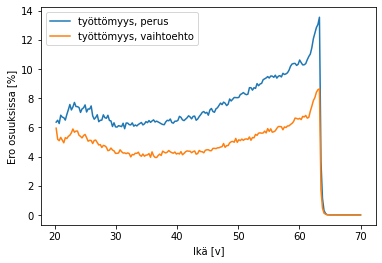

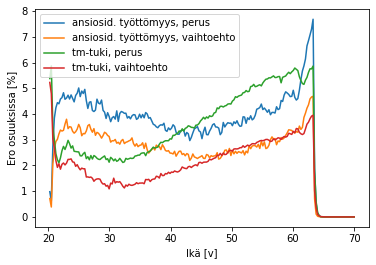

Työllisyysvaikutus 21-64-vuotiaisiin noin -16540 htv ja 85239 työllistä
Työllisiä 2097805 vs 2114345
Työllisyysastevaikutus 21-64-vuotiailla noin 2.85 prosenttia (78.49 vs 75.64)
epävarmuus työllisyysasteissa 0.0139, hajonta 0.0795


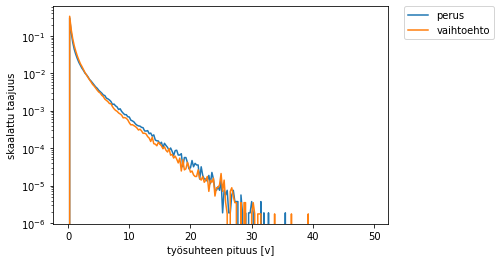

Jakauma ansiosidonnainen+tmtuki+putki, no max age
vaihtoehto keskikesto 0.5054456552109527 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 89475 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45224.75 v perus työtpäiviä yht 61623.25 v


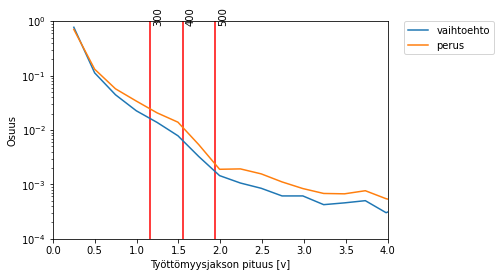

vaihtoehto keskikesto 0.5054456552109527 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 89475 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45224.75 v perus työtpäiviä yht 61623.25 v


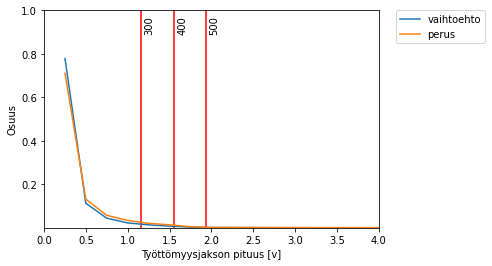

vaihtoehto keskikesto 0.5054456552109527 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 89475 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 45224.75 v perus työtpäiviä yht 61623.25 v


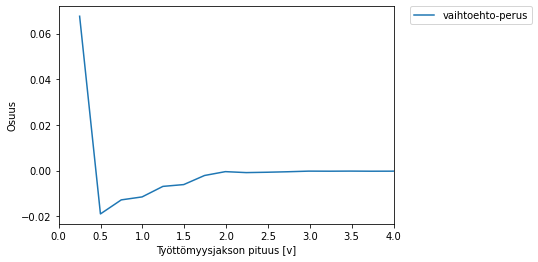

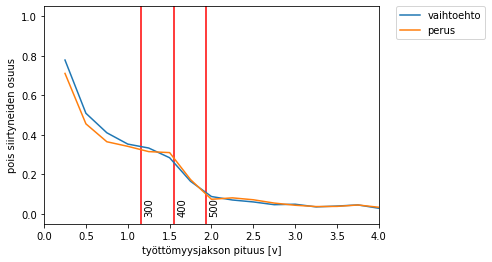

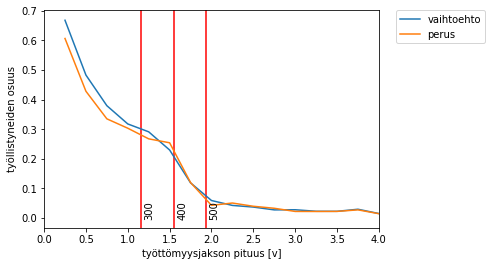

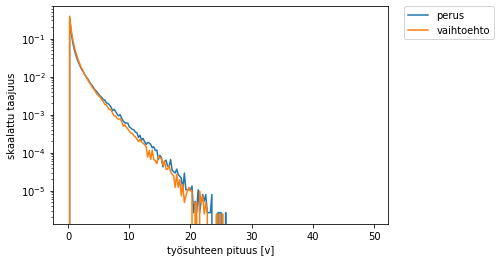

Jakauma ansiosidonnainen+tmtuki+putki, max age 54
vaihtoehto keskikesto 0.36423185364894106 v perus keskikesto 0.41592884986657813 v
Skaalaamaton vaihtoehto lkm 76255 v perus lkm 81321 v
Skaalaamaton vaihtoehto työtpäiviä yht 27774.5 v perus työtpäiviä yht 33823.75 v


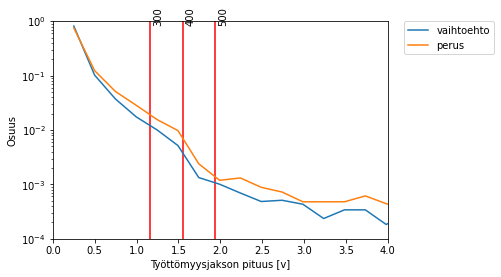

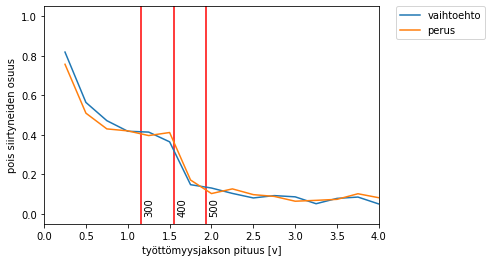

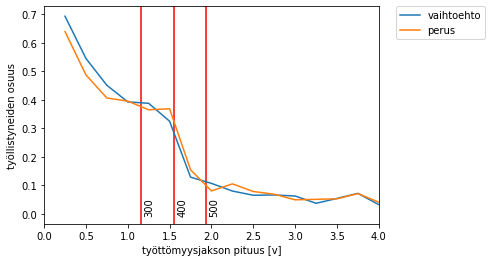

perus
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.84 |      0.14 |       0.02 |      0.00 |        0.00 |
| 30-39 |     0.83 |      0.13 |       0.05 |      0.00 |        0.00 |
| 40-49 |     0.83 |      0.12 |       0.05 |      0.00 |        0.00 |
| 50-59 |     0.76 |      0.16 |       0.07 |      0.00 |        0.00 |
| 60-65 |     0.59 |      0.19 |       0.11 |      0.05 |        0.07 |
+-------+----------+-----------+------------+-----------+-------------+
vaihtoehto
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.80 |      0.16 |       0.04 |      0.00 |        0.00 |
| 30-39 |     0.73 |      0.18 |       0.09 |  

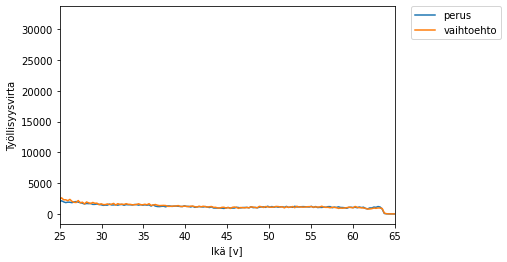

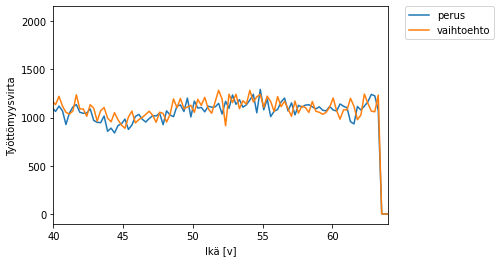

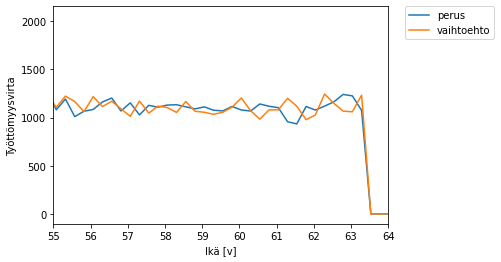

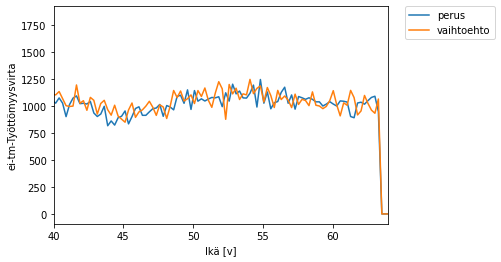

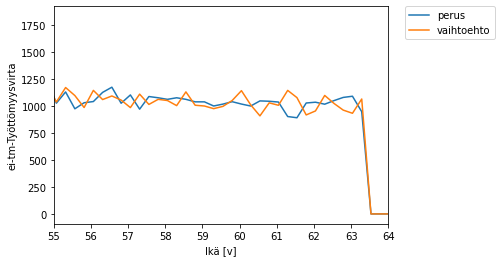

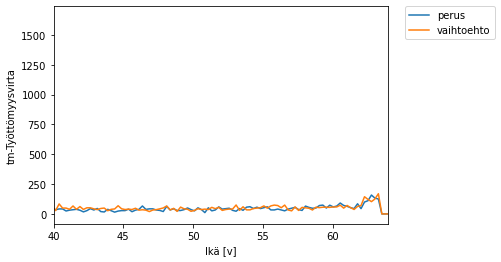

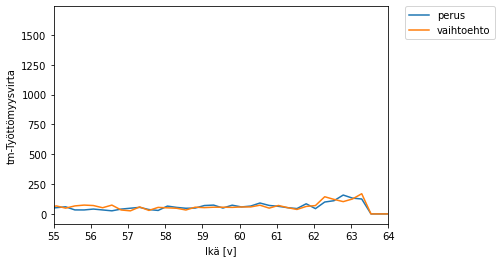

In [20]:
cc4_pt=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=True,
              randomness=randomness)
cc4_pt.load_sim(load=perustuloresults_vasemmistoliitto)
cc4_pt.compare_with(cc1)

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+----------------------+--------------------+
|                  |                  e/v |              toteuma |                ero |
|------------------+----------------------+----------------------+--------------------|
| palkkatulo       | 89,335,314,406.09    | 89,134,200,000.00    |     201,114,406.09 |
| etuusmeno        | 56,516,039,934.09    | 36,945,147,749.00    |  19,570,892,185.09 |
| verot            | 46,691,677,217.66    | 30,763,000,000.00    |  15,928,677,217.66 |
| valtionvero      | 37,660,899,316.86    |  5,542,000,000.00    |  32,118,899,316.86 |
| kunnallisvero    |                 0.00 | 18,991,000,000.00    | -18,991,000,000.00 |
| ptel             |  5,566,933,338.55    |  5,560,000,000.00    |       6,933,338.55 |
| tyotvakmaksu     |  1,697,370,973.72    |  1,693,549,800.00    |       3,821,173.72 |
| ansiopvraha      |    758,249,570.03    |  3,895,333,045.00    |  -3,137,083,474.

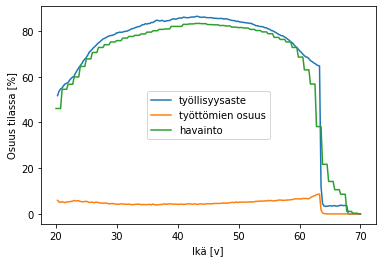

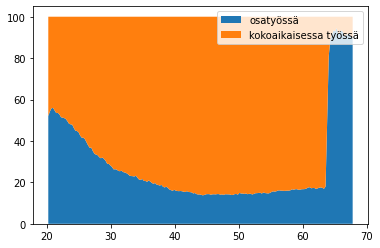

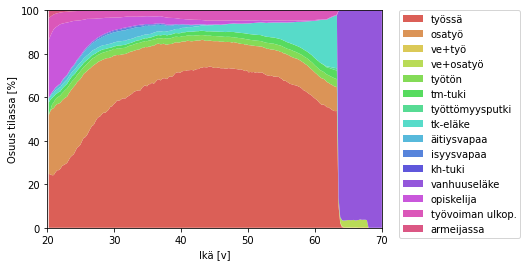

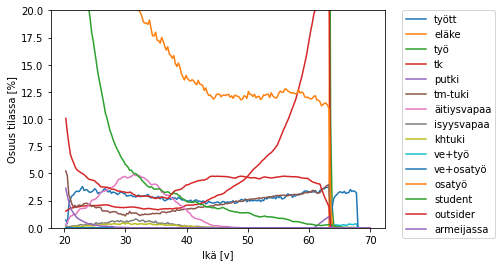

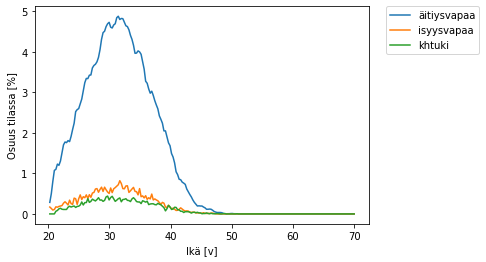

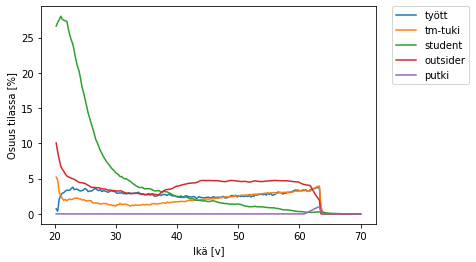

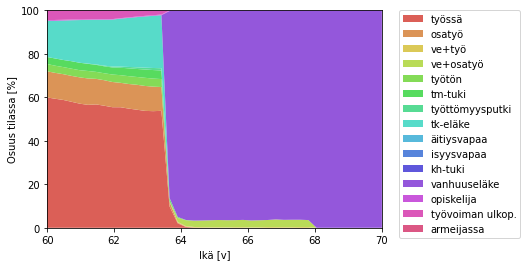

Lisäpäivillä on 1125 henkilöä


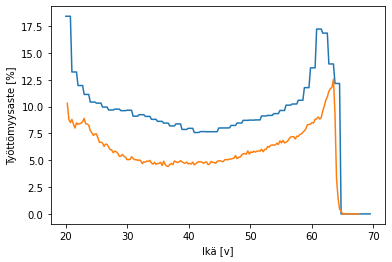

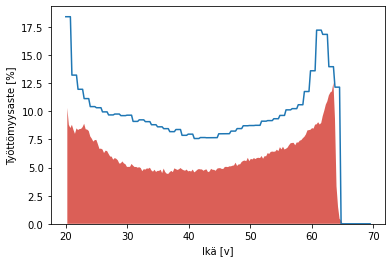

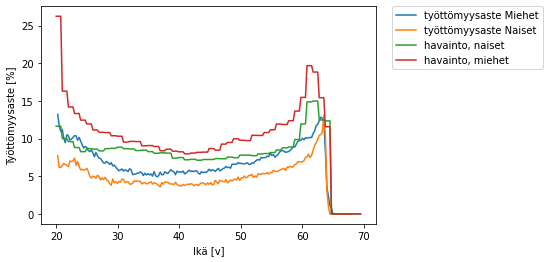

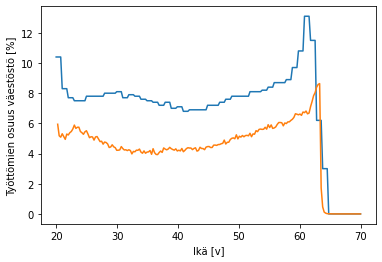

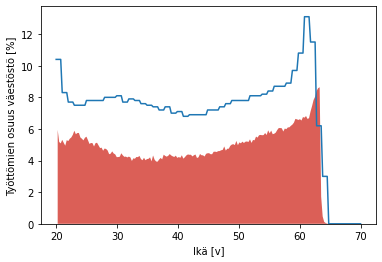

...

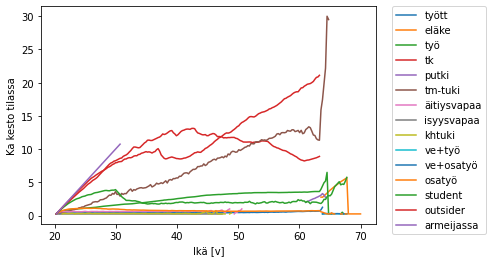

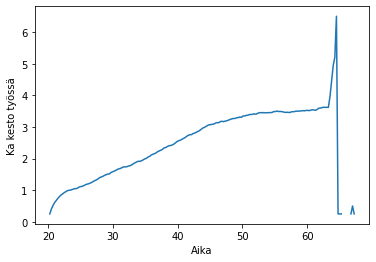

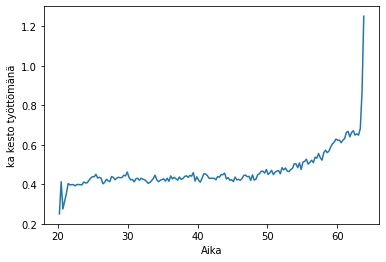

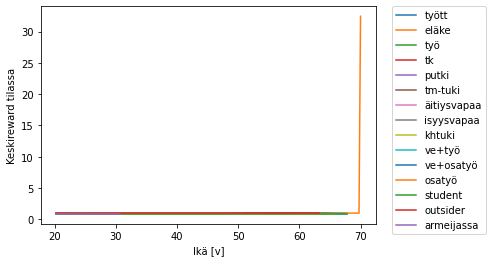

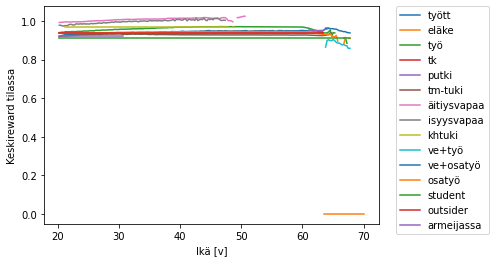

No handles with labels found to put in legend.


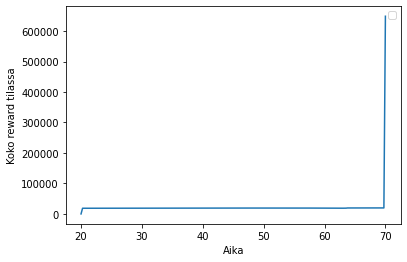

yhteensä reward 223.7341803943092


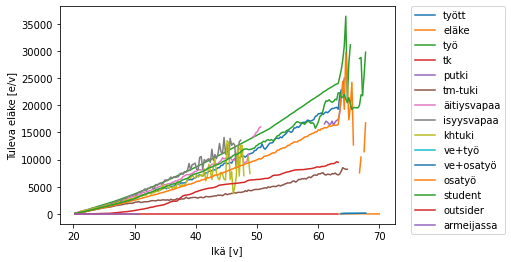

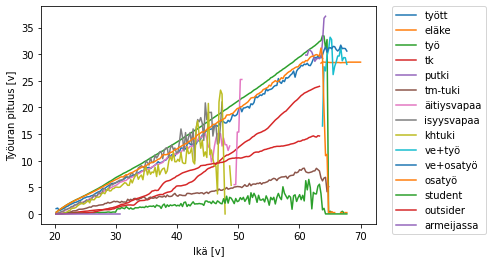

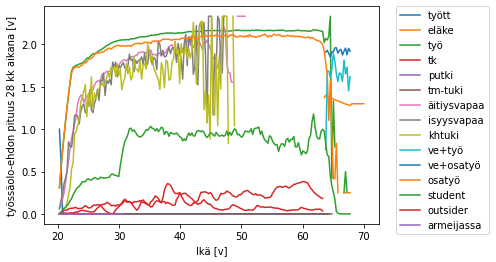

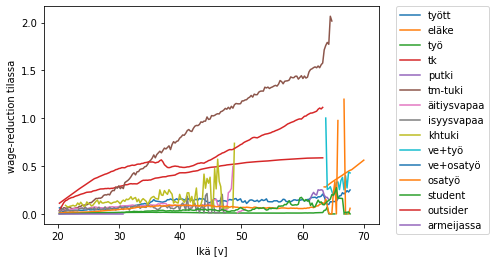

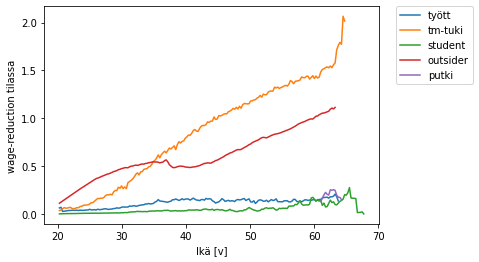

In [21]:
cc4_pt.render()

# Täysi perustulo 1000 e/kk

In [22]:
cc5_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='tonni')
cc5_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulomalli,plot=False,
                   results=perustuloresults_tonni,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)


plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875
training...
---------------------------------
| explained_variance | 0.997    |
| fps                | 2870     |
| nupdates           | 1        |
| policy_entropy     | 1.02     |
| policy_loss        | 0.00939  |
| total_timesteps    | 21816    |
| value_loss         | 0.0356   |
---------------------------------
---------------------------------
| explained_variance | 0.887    |
| fps                | 3077     |
| nupdates           | 10       |
| policy_entropy     | 0.983    |
| policy_loss        | -1.25    |
| total_timeste

---------------------------------
| explained_variance | 0.998    |
| fps                | 3021     |
| nupdates           | 260      |
| policy_entropy     | 1.03     |
| policy_loss        | -0.00987 |
| total_timesteps    | 5672160  |
| value_loss         | 0.0247   |
---------------------------------
---------------------------------
| explained_variance | 0.998    |
| fps                | 3021     |
| nupdates           | 270      |
| policy_entropy     | 1.01     |
| policy_loss        | -0.00929 |
| total_timesteps    | 5890320  |
| value_loss         | 0.0215   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3021     |
| nupdates           | 280      |
| policy_entropy     | 1.05     |
| policy_loss        | -0.0165  |
| total_timesteps    | 6108480  |
| value_loss         | 0.0138   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+----------------------+--------------------+
|                  |                  e/v |              toteuma |                ero |
|------------------+----------------------+----------------------+--------------------|
| palkkatulo       | 88,514,900,754.02    | 89,134,200,000.00    |    -619,299,245.98 |
| etuusmeno        | 56,447,217,784.25    | 36,945,147,749.00    |  19,502,070,035.25 |
| verot            | 46,220,773,187.21    | 30,763,000,000.00    |  15,457,773,187.21 |
| valtionvero      | 37,271,960,235.89    |  5,542,000,000.00    |  31,729,960,235.89 |
| kunnallisvero    |                 0.00 | 18,991,000,000.00    | -18,991,000,000.00 |
| ptel             |  5,515,351,666.52    |  5,560,000,000.00    |     -44,648,333.48 |
| tyotvakmaksu     |  1,681,783,114.33    |  1,693,549,800.00    |     -11,766,685.67 |
| ansiopvraha      |    740,113,476.88    |  3,895,333,045.00    |  -3,155,219,568.

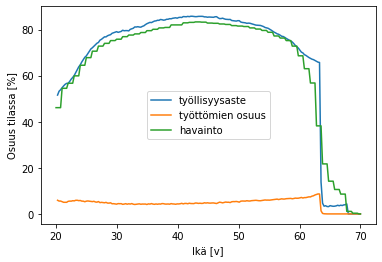

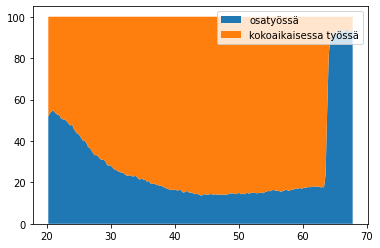

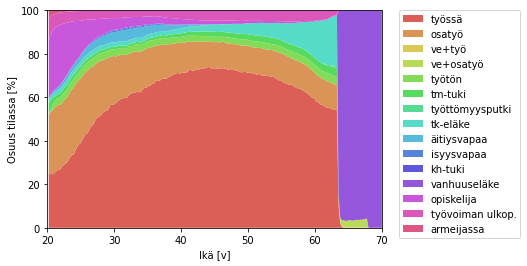

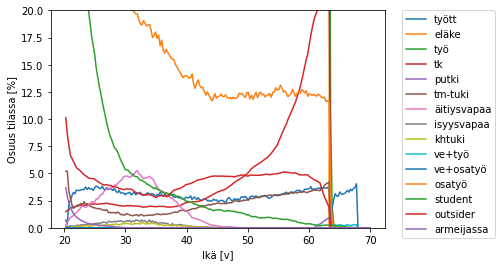

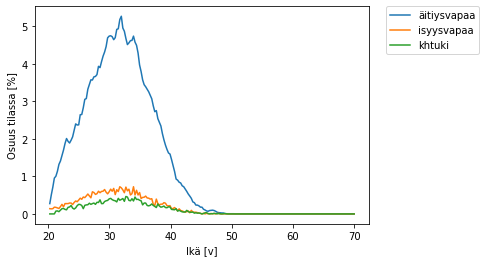

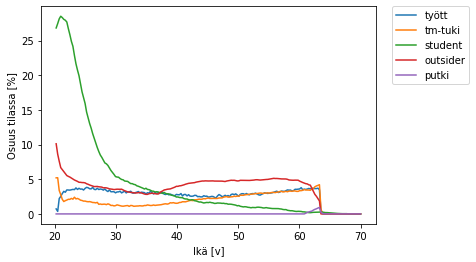

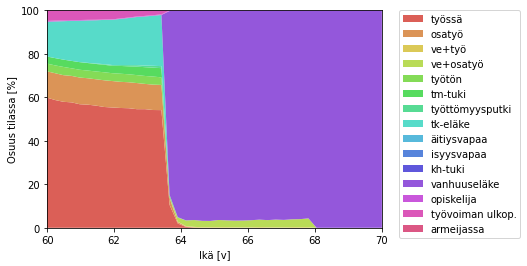

Lisäpäivillä on 1000 henkilöä


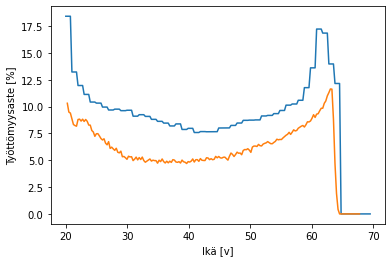

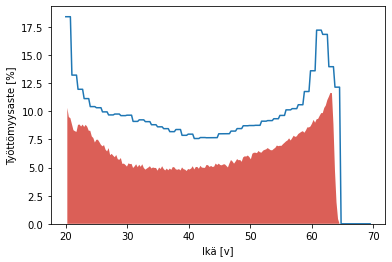

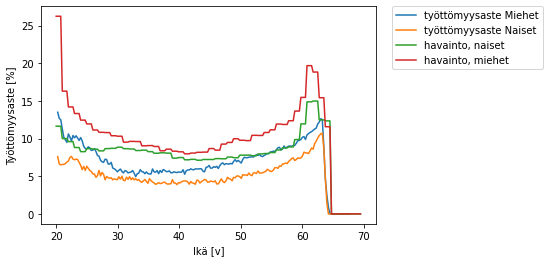

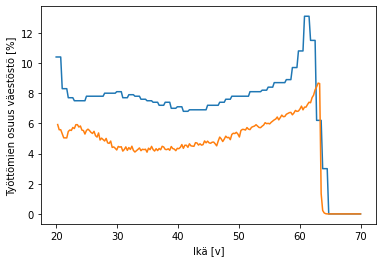

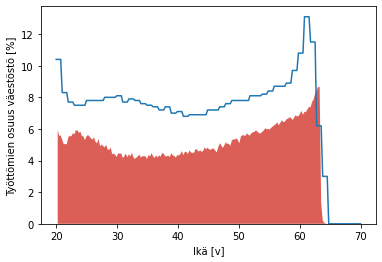

...

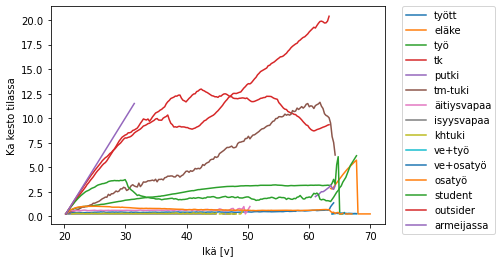

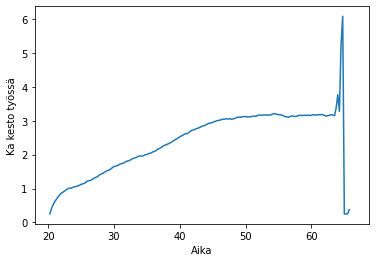

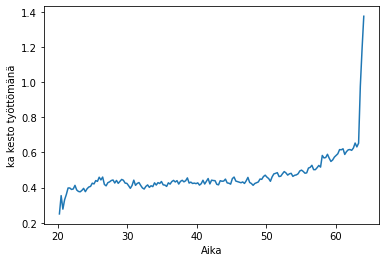

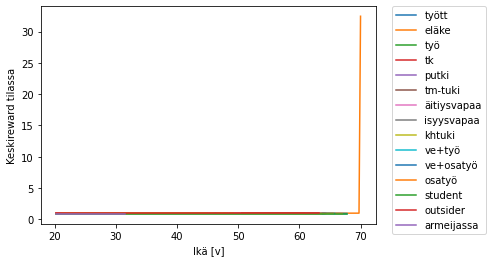

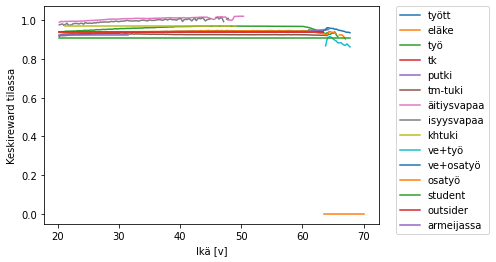

No handles with labels found to put in legend.


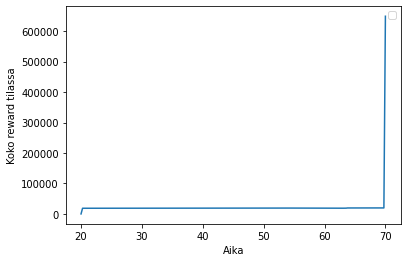

yhteensä reward 223.67571961443952


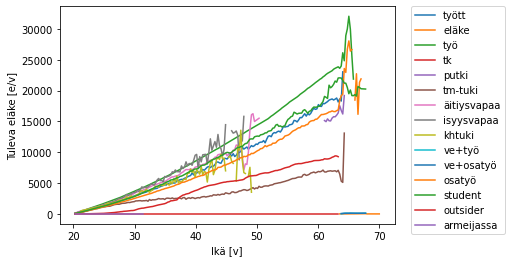

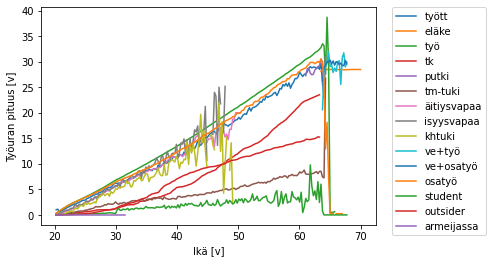

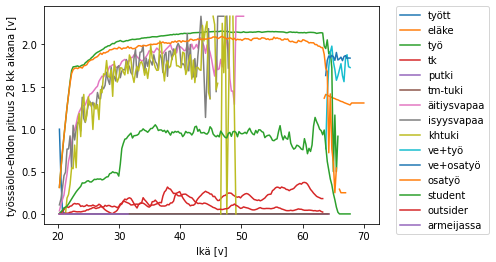

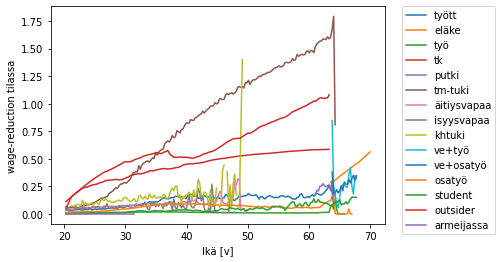

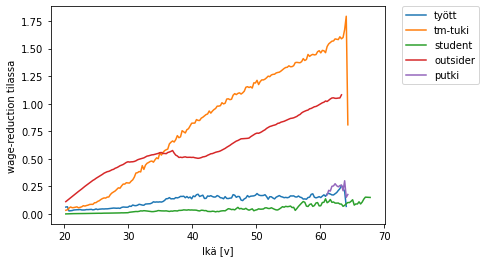

In [23]:
cc5_pt.render()

plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

Rahavirrat skaalattuna väestötasolle
+------------------+----------------------+-----------------------+-----------------------+
|                  |           vaihtoehto |                 perus |                   ero |
|------------------+----------------------+-----------------------+-----------------------|
| palkkatulo       | 88,514,900,754.02    |  89,421,388,349.21    |    -906,487,595.19    |
| etuusmeno        | 56,447,217,784.25    |  41,580,523,561.46    |  14,866,694,222.79    |
| verot            | 46,220,773,187.21    |  31,294,604,923.77    |  14,926,168,263.44    |
| valtio

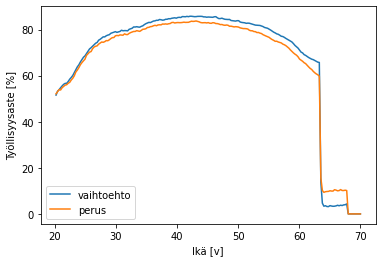

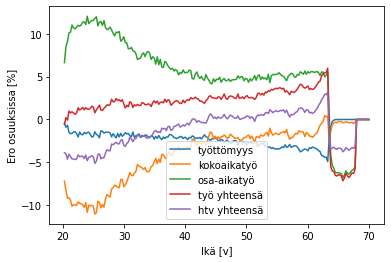

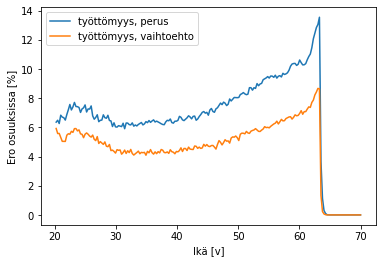

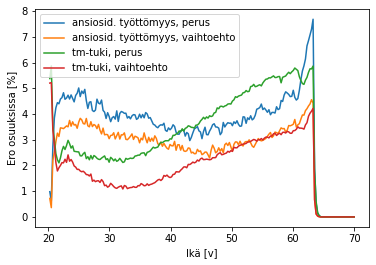

Työllisyysvaikutus 21-64-vuotiaisiin noin -25928 htv ja 74288 työllistä
Työllisiä 2088417 vs 2114345
Työllisyysastevaikutus 21-64-vuotiailla noin 2.48 prosenttia (78.12 vs 75.64)
epävarmuus työllisyysasteissa 0.0139, hajonta 0.0783


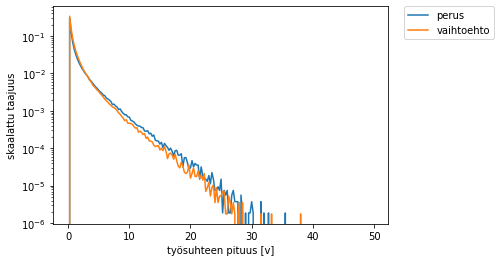

Jakauma ansiosidonnainen+tmtuki+putki, no max age
vaihtoehto keskikesto 0.4915842099781273 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 96010 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 47197.0 v perus työtpäiviä yht 61623.25 v


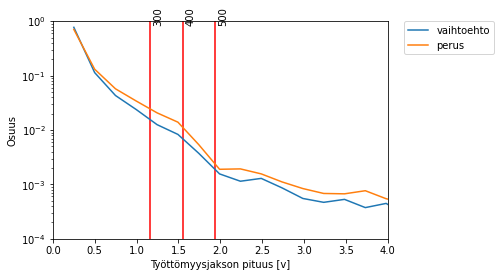

vaihtoehto keskikesto 0.4915842099781273 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 96010 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 47197.0 v perus työtpäiviä yht 61623.25 v


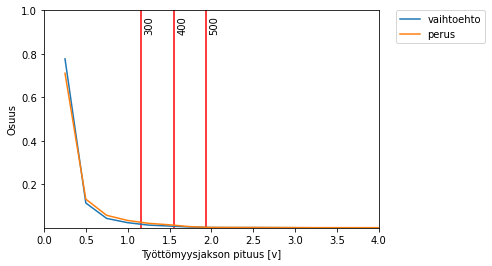

vaihtoehto keskikesto 0.4915842099781273 v perus keskikesto 0.6469564623993449 v
Skaalaamaton vaihtoehto lkm 96010 v perus lkm 95251 v
Skaalaamaton vaihtoehto työtpäiviä yht 47197.0 v perus työtpäiviä yht 61623.25 v


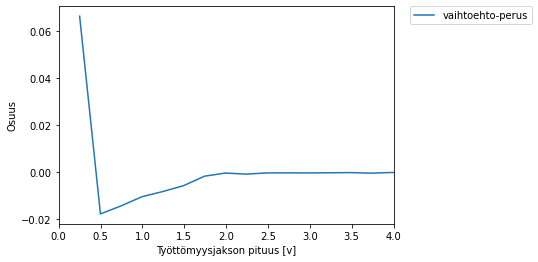

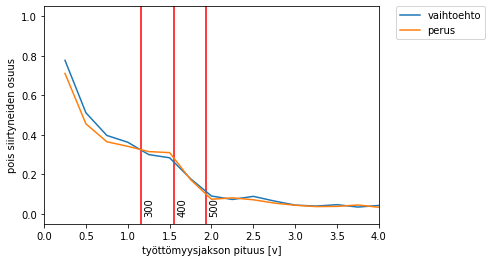

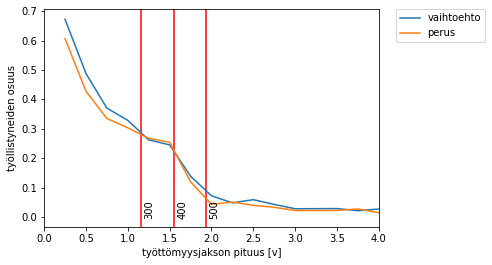

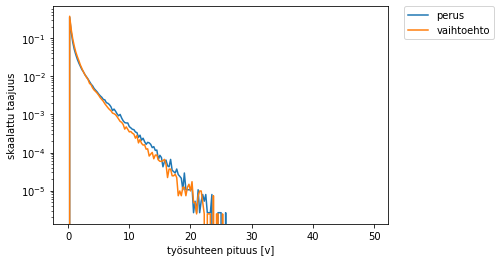

Jakauma ansiosidonnainen+tmtuki+putki, max age 54
vaihtoehto keskikesto 0.3672915638875185 v perus keskikesto 0.41592884986657813 v
Skaalaamaton vaihtoehto lkm 81080 v perus lkm 81321 v
Skaalaamaton vaihtoehto työtpäiviä yht 29780.0 v perus työtpäiviä yht 33823.75 v


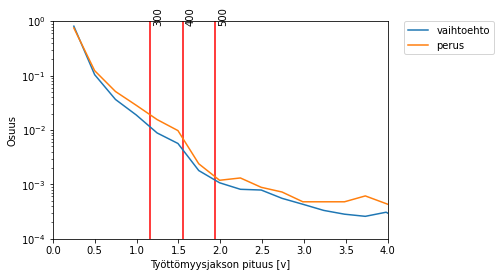

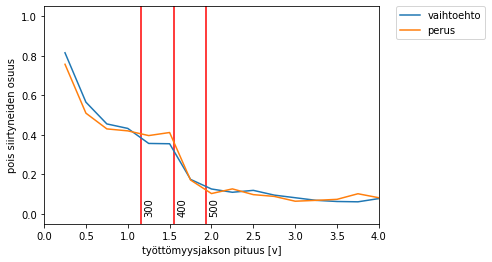

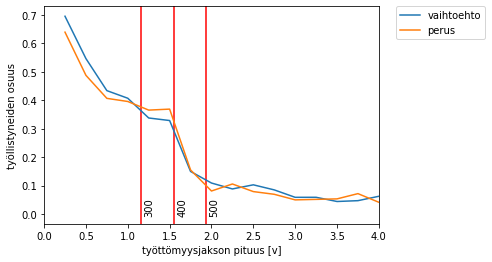

perus
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.85 |      0.13 |       0.03 |      0.00 |        0.00 |
| 30-39 |     0.83 |      0.12 |       0.04 |      0.00 |        0.00 |
| 40-49 |     0.84 |      0.12 |       0.05 |      0.00 |        0.00 |
| 50-59 |     0.77 |      0.15 |       0.07 |      0.00 |        0.00 |
| 60-65 |     0.63 |      0.18 |       0.09 |      0.05 |        0.06 |
+-------+----------+-----------+------------+-----------+-------------+
vaihtoehto
+-------+----------+-----------+------------+-----------+-------------+
|       |   0-6 kk |   6-12 kk |   12-18 kk |   18-24kk |   yli 24 kk |
|-------+----------+-----------+------------+-----------+-------------|
| 20-29 |     0.80 |      0.16 |       0.04 |      0.00 |        0.00 |
| 30-39 |     0.73 |      0.18 |       0.09 |  

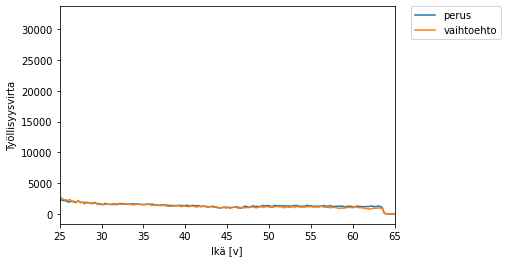

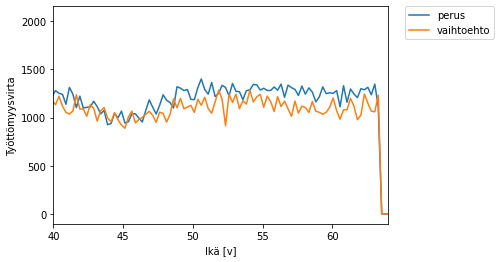

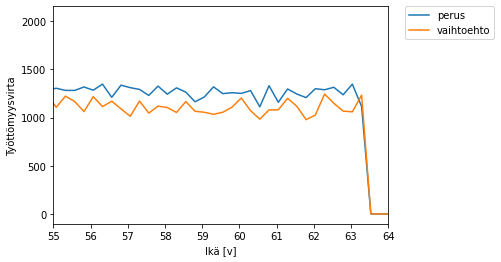

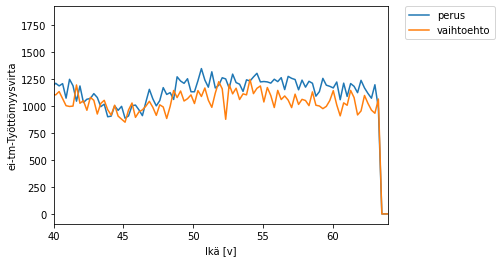

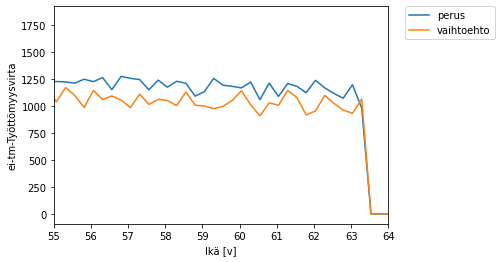

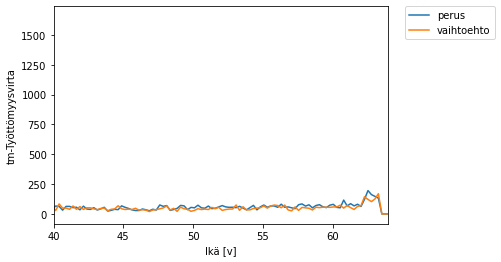

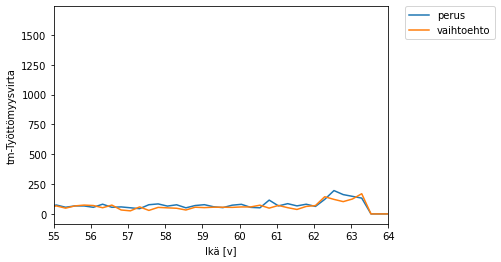

In [24]:
cc5_pt=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=True,
              randomness=randomness)
cc5_pt.load_sim(load=perustuloresults_tonni)
cc5_pt.compare_with(cc1)

# 1500 e/kk

In [25]:
cc6_pt=Lifecycle(env='unemployment-v1',minimal=False,perustulo=True,mortality=mortality,
                 randomness=randomness,perustulomalli='puolitoista')
cc6_pt.run_results(debug=False,steps1=size1,steps2=size2,pop=pop_size,deterministic=deterministic,
                   train=True,predict=True,batch1=batch1,batch2=batch2,
                   save=perustulomalli_puolitoista,plot=False,
                   results=perustulomalli_puolitoista,start_from=perusmalli,cont=True,
                   callback_minsteps=callback_minsteps,twostage=twostage)


plotdebug False
No mortality included
False
Perustulomalli Kela
Parameters of lifecycle:
timestep 0.25
gamma 0.9793703613355593 (0.9200000000000003 per anno)
min_age 20
max_age 70
min_retirementage 63.5
max_retirementage 68
ansiopvraha_kesto300 300
ansiopvraha_kesto400 400
ansiopvraha_toe 0.5
perustulo True
karenssi_kesto 0.25
mortality False
randomness True
include_putki True
include_pinkslip True

train...
phase 1
batch 9 learning rate 0.0625 scaled 0.1875
training...
---------------------------------
| explained_variance | 0.998    |
| fps                | 2943     |
| nupdates           | 1        |
| policy_entropy     | 1.01     |
| policy_loss        | 0.016    |
| total_timesteps    | 21816    |
| value_loss         | 0.031    |
---------------------------------
---------------------------------
| explained_variance | 0.92     |
| fps                | 3108     |
| nupdates           | 10       |
| policy_entropy     | 1.01     |
| policy_loss        | -0.465   |
| total_timeste

---------------------------------
| explained_variance | 0.999    |
| fps                | 3035     |
| nupdates           | 260      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.00931 |
| total_timesteps    | 5672160  |
| value_loss         | 0.0129   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3036     |
| nupdates           | 270      |
| policy_entropy     | 1.05     |
| policy_loss        | -0.0118  |
| total_timesteps    | 5890320  |
| value_loss         | 0.0121   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps                | 3035     |
| nupdates           | 280      |
| policy_entropy     | 1.04     |
| policy_loss        | -0.00749 |
| total_timesteps    | 6108480  |
| value_loss         | 0.0121   |
---------------------------------
---------------------------------
| explained_variance | 0.999    |
| fps         

UnpicklingError: invalid load key, 'H'.

In [ ]:
cc6_pt.render()

In [ ]:
cc6_pt=Lifecycle(env='unemployment-v1',minimal=False,mortality=mortality,perustulo=True,
              randomness=randomness)
cc6_pt.load_sim(load=perustulomalli_puolitoista)
cc6_pt.compare_with(cc1)

# Tulokset

tm

Työllisyysvaikutus 21-64-vuotiaisiin noin -43293 htv ja 117303 työllistä
Työllisiä 2028831 vs 2072124

Kela

